# Grand-canonical reweighting

notebook from work by Nicola Calonaci "Molecular Dynamics simulations with grand-canonical reweighting suggest cooperativity effects in RNA structure probing experiments"

In [1]:
import numpy as np
from scipy.special import comb # number of combinations
import matplotlib.pyplot as plt

## 1. Purely entropic system

I first assume a lattice system with S sites, $S_A$ of which are part of region A and $S_B$ of which are part of region B. 

### Introduction

In [24]:
Sa = 15
Sb = 3
S = Sa + Sb

I then populate them with N particles. Particles are not interacting except for mutual exclusion (two particles cannot be in the same site). Particles are undistinguishable. The functions OmegaA and OmegaB can be found as combinations.

Notice that Omega are defined up to an arbitrary multiplicative constant and up to a factor that can be used to multiply OmegaA and OmegaB times factor^k. I decide to normalize them setting to 1 the first non-zero element (for A) and to 1 the next element (for B). The physical motivation is:
- I set the free-energy with no particles to zero. If I filled too many particles in, the free energy for few particles might be infinite. I thus set to zero the free energy corresponding to the smallest possible number of particles in the region.
- For region B, which I assume to be the buffer, I set the free energy for the insertion of the first additional particle to zero.

Importantly, this convention is only importance in comparing exact $Omega$ with inferred one, and has no effect on the computed observables

In [20]:
def normalize(OA, OB):
    A = np.array(OA)
    B = np.array(OB)
    
    for k in range(len(A)):
        if A[k] != 0:
            A /= A[k]
            break
    
    for k in range(len(B)):
        if B[k] != 0:
            B /= B[k]
            factor = B[k + 1]/B[k]
            break
    
    for k in range(len(B)):
        B[k] /= factor**k
    
    for k in range(len(A)):
        A[k] /= factor**k
    
    return A,B

[1.0, 15.0, 225.0, 3375.0, 50625.0, 759375.0, 11390625.0, 170859375.0, 2562890625.0, 38443359375.0, 576650390625.0, 8649755859375.0, 129746337890625.0, 1946195068359375.0, 2.9192926025390624e+16, 4.378938903808594e+17] [1.0, 3.0, 9.0, 27.0]


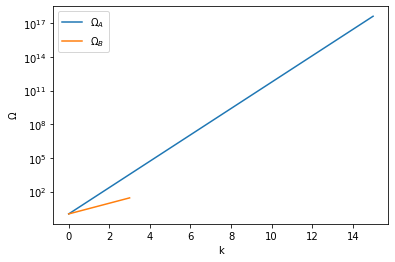

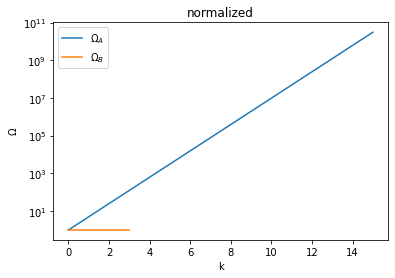

In [25]:
OmegaA = []
OmegaB = []

for i in range(Sa + 1):
    # OmegaA.append(comb(Sa, i))
    OmegaA.append(np.float(Sa**i))

for i in range(Sb + 1):
    # OmegaB.append(comb(Sb, i))
    OmegaB.append(np.float(Sb**i))

print(OmegaA, OmegaB)

plt.figure()
plt.plot(OmegaA, label="$\Omega_A$")
plt.plot(OmegaB, label="$\Omega_B$")

plt.xlabel("k")
plt.ylabel("$\Omega$")
plt.legend()
plt.yscale("log")
plt.show()

OmegaA, OmegaB = normalize(OmegaA, OmegaB)

plt.figure()

# plt.plot(-np.log(OmegaA), label="$\Omega_A$")
# plt.plot(-np.log(OmegaB), label="$\Omega_B$")
# plt.ylabel("$-\log\Omega$")

plt.plot(OmegaA, label="$\Omega_A$")
plt.plot(OmegaB, label="$\Omega_B$")
plt.ylabel('$\Omega$')

plt.xlabel("k")
plt.title('normalized')
plt.legend()
plt.yscale("log")
plt.show()

I now imagine to run a number of simulations so as to obtain samples from ensembles with a constant number of particles. In particular, L[N] is the number of snapshots taken with N particles

In [15]:
L = {}

# I assume to arrive to concentration ~ 0.25 (one fourth of the sites are occupied)
for i in range(1, (S + 1)//4, 2):
    L[i] = 300

L

{1: 300, 3: 300}

In [26]:
L = {}

# I assume to arrive to concentration ~ 0.25 (one fourth of the sites are occupied)
for i in range(1, S//2 + 1):
    # L[i] = 100
    L[i] = np.random.randint(1, 200)


L

{1: 80, 2: 42, 3: 19, 4: 41, 5: 183, 6: 12, 7: 167, 8: 112, 9: 94}

In [27]:
L = {}

my_indices = np.arange(1, S//2 + 1)

for i in range(len(my_indices)//2):
    L[i] = 20
for i in range(len(my_indices)//2, len(my_indices)):
    L[i] = 5

L

{0: 20, 1: 20, 2: 20, 3: 20, 4: 5, 5: 5, 6: 5, 7: 5, 8: 5}

In [8]:
L = {19: 100}

L

{19: 100}

BUT... it's independent on how you choose the n. of frames of each trajectory! Which is physically right, but the minimization of the loss function should lead to different results...? (see the function **solve** below)

This is a tool that generate the histograms given simulation lengths L and OmegaA and OmegaB. It can do either exact or approximate histograms. Approximate histograms can be used to test finite sampling effects.

for exact = True: generate_histograms returns $\vec A,\vec B$ with

$\vec A = \sum_N \vec P_A(N)\cdot l(N)$

where each $\vec P_A(N)$ is the array whose k-th component is given by

$P_A(N)_k = \Omega_A(k)\cdot\Omega_B(N-k)$ = (n. of states of system A+B with k particles in sub-system A)

normalized, and the same for $\vec B$

In [17]:
def generate_histograms(OA, OB, L, exact=True, seed=0, if_also_P=False):

    if not exact:
        np.random.seed(seed)
    
    if True or exact:
        A = np.zeros(len(OA))
        B = np.zeros(len(OB))
    else:
        A = np.zeros(len(OA), dtype=int)
        B = np.zeros(len(OB), dtype=int)
    
    PA = {}
    PB = {}

    for N in L.keys():
        
        PA[N] = np.zeros(len(OA))
        
        for k in range(len(OA)):
            if (N - k) >= 0 and (N - k) < len(OB):
                PA[N][k] += OA[k]*OB[N - k]
        
        PA[N] /= np.sum(PA[N])

        PB[N] = np.zeros(len(OB))
        
        for k in range(len(OB)):
            if (N - k) >= 0 and (N - k) < len(OA):
                PB[N][k] += OA[N - k]*OB[k]
        
        PB[N] /= np.sum(PB[N])

        if exact:
            A += PA[N]*L[N]
            B += PB[N]*L[N]
        else:
            Atraj = np.random.choice(len(PA[N]), p=PA[N], size=L[N])
            Btraj = N - Atraj
            A += np.bincount(Atraj, minlength=len(A))
            B += np.bincount(Btraj, minlength=len(B))
    
    if if_also_P:
        return A, B, PA, PB
    return A, B

Testing the function above

In [28]:
A, B, PA, PB = generate_histograms(OmegaA, OmegaB, L, if_also_P=True)

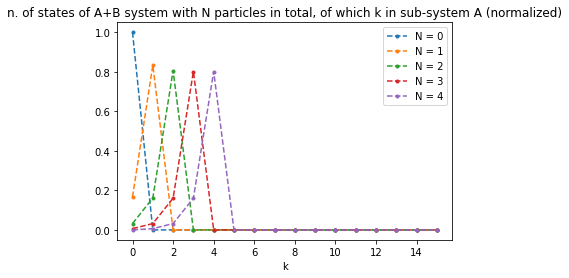

In [29]:
for N in list(PA.keys())[:5]:
    plt.plot(PA[N], '.--', label='N = ' + str(N))

plt.title('n. of states of A+B system with N particles in total, of which k in sub-system A (normalized)')
plt.legend()
plt.xlabel('k')
plt.show()

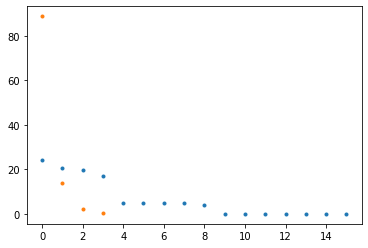

In [30]:
plt.plot(A, '.')
plt.plot(B, '.')

# check with the averages if all the trajectories at different N have the same n. of snapshots
# temp = np.array(list(PA.values()))
# av = np.mean(temp, axis=0)

# av

# plt.plot(av*100*len(PA.keys()), '.')


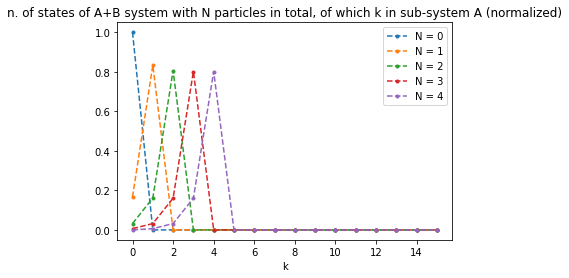

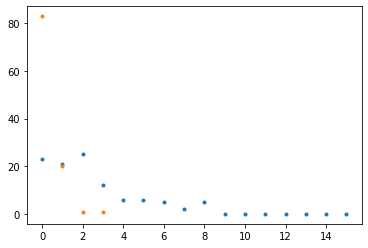

In [31]:
A, B, PA, PB = generate_histograms(OmegaA, OmegaB, L, exact=False, if_also_P=True)

plt.figure()

for N in list(PA.keys())[:5]:
    plt.plot(PA[N], '.--', label='N = ' + str(N))

plt.title('n. of states of A+B system with N particles in total, of which k in sub-system A (normalized)')
plt.legend()
plt.xlabel('k')
plt.show()

plt.figure()
plt.plot(A, '.')
plt.plot(B, '.')

I then define the tools that can be used to infer OmegaA and OmegaB from the knowledge of L,A, and B. A and B will be the histograms in region A and B, respectively.

### Infer OmegaA and OmegaB

In [32]:
def iterate(A, B, L, OA, OB):
    if OA is None:
        OA = + A
        OA = np.ones(len(A))
        # OA[-1]=1000.0 # this is on purpose a weird initialization
        # THIS IS TO CHECK THE FIXED POINT:
        # OA=+OmegaA
    if OB is None:
        OB = + B
        OB = np.ones(len(B))
        # OB[-1]=1000.0 # this is on purpose a weird initialization
        # THIS IS TO CHECK THE FIXED POINT:
        # OB=+OmegaB
    
    # find normalization factors first:
    C = {}
    for N in L.keys():
        s = 0
        for k in range(len(OA)):
            if (N - k) >= 0 and (N - k) < len(OB): # outside of bounds, OA and OB are implicitely zero
                s += OA[k]*OB[N - k]
        C[N] = 1.0/s

    OA_new = np.zeros(len(OA))
    for k in range(len(OA)):
        s = 0
        for N in L.keys():
            if (N - k) >= 0 and (N - k) < len(OB): # outside of bounds, OB is implicitely zero
                s += L[N]*C[N]*OB[N - k]
        if A[k] == 0:
            OA_new[k] = 0.0
        else:
            OA_new[k] = A[k]/s
     
    OB_new = np.zeros(len(OB))
    for k in range(len(OB)):
        s = 0
        for N in L.keys():
            if (N - k) >= 0 and (N - k) < len(OA): # outside of bounds, OA is implicitely zero
                s += L[N]*C[N]*OA[N - k]
        if B[k] == 0:
            OB_new[k] = 0.0
        else:
            OB_new[k] = B[k]/s

    # normalize, this is purely for plotting:
    eps = np.sum((OA_new - OA)**2) + np.sum((OB_new - OB)**2)
    OA_new, OB_new = normalize(OA_new, OB_new)
    return OA_new, OB_new, eps

def solve(A, B, L, threshold=1e-10):
    OA, OB = None, None
    for i in range(100000):
        OA, OB, eps = iterate(A, B, L, OA, OB)
        if (eps < threshold):
            break
    print("# iterations", i)
    return OA, OB

# iterations 218


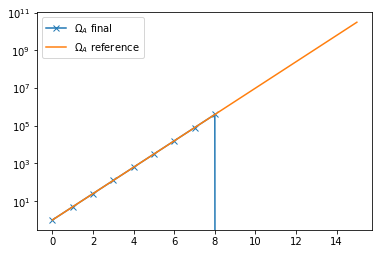

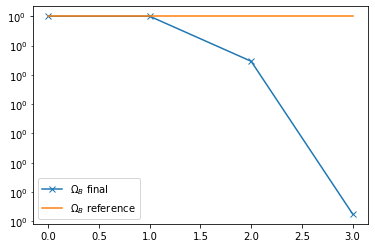

In [33]:
A, B = generate_histograms(OmegaA, OmegaB, L)
OA, OB = solve(A, B, L)

plt.plot(OA, "x-", label="$\Omega_A$ final")
plt.plot(OmegaA, "-", label="$\Omega_A$ reference")
plt.legend()
plt.yscale("log")
plt.show()
plt.plot(OB, "x-", label="$\Omega_B$ final")
plt.plot(OmegaB, "-", label="$\Omega_B$ reference")
plt.legend()
plt.yscale("log")
plt.show()

#### alternatively: minimize the loss function

\begin{equation}
\mathcal L(\Omega_A, \Omega_B) = -\sum_N \sum_k t_{Nk} \log\frac{\Omega_A(k)\Omega_B(N-k)}{\sum_{k'}\Omega_A(k')\Omega_B(N-k')}
\end{equation}

In [57]:
OmegaA

array([1.00000000e+00, 1.00000000e+00, 4.75000000e-01, 1.42500000e-01,
       3.02812500e-02, 4.84500000e-03, 6.05625000e-04, 6.05625000e-05,
       4.92070313e-06, 3.28046875e-07, 1.80425781e-08, 8.20117187e-10,
       3.07543945e-11, 9.46289063e-13, 2.36572266e-14, 4.73144531e-16,
       7.39288330e-18, 8.69750977e-20, 7.24792480e-22, 3.81469727e-24,
       9.53674316e-27])

In [58]:
def loss_fun(x, *, t: dict, len_OmegaA: int):
    
    # to pass a single input as the variable to optimize
    OmegaA = x[:len_OmegaA]
    OmegaB = x[len_OmegaA:]

    loss = 0
    
    for N in L.keys():
        s = 0
        for k in range(len(OmegaA)):
            if (N - k) >= 0 and (N - k) < len(OmegaB): # outside of bounds, OA and OB are implicitely zero
                OmegaAB = OmegaA[k]*OmegaB[N - k]
                loss -= t[N][k]*np.log(OmegaAB)
                s += OmegaAB

        loss += np.sum(t[N])*np.log(s)
    
    return loss

In [19]:
import jax
import jax.numpy as jnp

In [21]:
dloss_dOmegaA = jax.grad(loss_fun, argnums=0)
dloss_dOmegaB = jax.grad(loss_fun, argnums=1)

In [22]:
dloss_dOmegaA

<function __main__.loss_fun(OmegaA, OmegaB, *, t:dict)>

### Infer chemical potential

Now I plot average number of particles in A and in B in the grand-canonical ensemble

NOTICE: the chemical potential is defined such as $\mu = \frac{\partial (-T S_B)}{\partial n}$, where $S_B$ is the entropy of the "particles bath" and the derivative is evaluated at the total n. of particles. Consequently, the grand-canonical probability to have k particles in system A is

\begin{equation}
P_A(k) = \frac{1}{Z} \Omega_A(k) e^{\beta\mu k}
\end{equation}

hence, high average n. of particles for high chemical potential $\mu$. This is the opposite of the convention here adopted for $\mu$. Let's take the "incorrect" one.

change $mu\cdot k$ to $-mu\cdot k$

In [62]:
# OmegaA,OmegaB: exact
# OA,OB: estimates
# murange: range

def plot_N_of_mu(OmegaA, OmegaB, OA, OB, murange=(-10, 10)):
    
    NA = []
    NB = []
    estimate_NA = []
    estimate_NB = []

    mu_values = np.linspace(murange[0], murange[1])

    for mu in mu_values:
        P = + OmegaA
        for k in range(len(P)):
            P[k] *= np.exp(-mu*k)
        P /= np.sum(P)
        NA.append(np.sum(P*range(len(P))))

        P = + OmegaB
        for k in range(len(P)):
            P[k] *= np.exp(-mu*k)
        P /= np.sum(P)
        NB.append(np.sum(P*range(len(P))))

        P = + OA
        for k in range(len(P)):
            P[k] *= np.exp(-mu*k)
        P /= np.sum(P)
        estimate_NA.append(np.sum(P*range(len(P))))

        P = + OB
        for k in range(len(P)):
            P[k] *= np.exp(-mu*k)
        P /= np.sum(P)
        estimate_NB.append(np.sum(P*range(len(P))))

    plt.figure()
    plt.plot(mu_values, NA, label="NA")
    plt.plot(mu_values, NB, label="NB")
    plt.plot(mu_values, estimate_NA, "x", label="estimate_NA")
    plt.plot(mu_values, estimate_NB, "x", label="estimate_NB")
    plt.xlabel("mu")
    plt.ylabel("<N>")
    plt.legend()
    plt.show()
    plt.plot(NA, NB, "o", label="exact")
    plt.plot(estimate_NA, estimate_NB, "x", label="estimate")
    plt.xlabel("NA")
    plt.ylabel("NB")
    plt.legend()
    plt.show()

    return mu_values, NA, NB, estimate_NA, estimate_NB


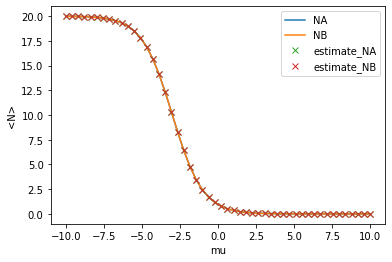

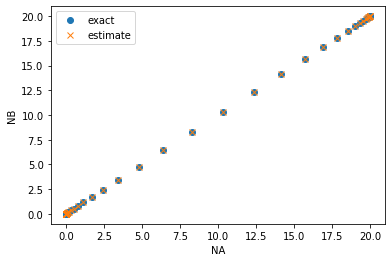

In [25]:
out = plot_N_of_mu(OmegaA, OmegaB, OA, OB)

mu_values = out[0]
NA = out[1]

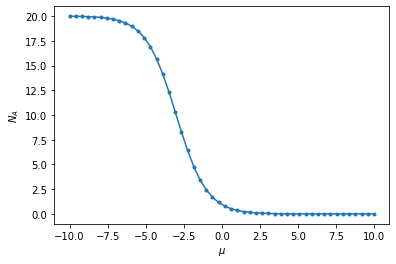

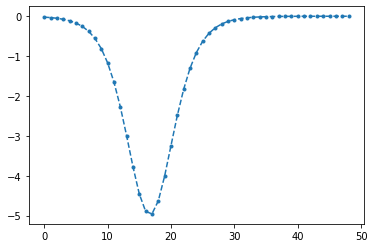

In [29]:
plt.plot(mu_values, NA, '.-')
plt.xlabel('$\mu$')
plt.ylabel('$N_A$')

dmu_dN = np.ediff1d(mu_values)/np.ediff1d(NA)

plt.figure()
plt.plot(dmu_dN**(-1), '.--')
plt.show()



Inference works well when the chemical potential is high enough so that the number of particles is small.

Now I do a realistic exercise. I first fix the average value of NB, then find mu.

Given $\vec\Omega_B$ (the n. of microstates of system B with k particles, exact or approximate) and the n. of particles in system B $ N_B $ (in NBlist), find $\mu$ through search for the min. of $(\langle N_B\rangle(\mu) - N_B)^2$, where

$\langle N_B\rangle(\mu) = \sum_k k P(\mu;k)=\sum_k k \, \Omega_B(k)\,e^{-\mu k}$

Rather than using the derivative $d\mu/d\langle N\rangle$ (as done by Bingqing), just increase (tune) the chemical potential $\mu$ until you get the desired value for $\langle N\rangle$

In [30]:
def infer_mu(OmegaB, NB, rate=0.1, N_max_iter=1000, threshold=1e-30):
    
    mu = 0
    
    for i in range(N_max_iter):
        
        P = + OmegaB
        for k in range(len(P)):
            P[k] *= np.exp(-mu*k)

        # print(P)
        
        P /= np.sum(P)
        NB_estimate = np.sum(P*range(len(P)))
        if (NB - NB_estimate)**2 < threshold:
            break
        
        mu -= rate*(NB - NB_estimate)

    return mu

Text(0, 0.5, '$\\mu$')

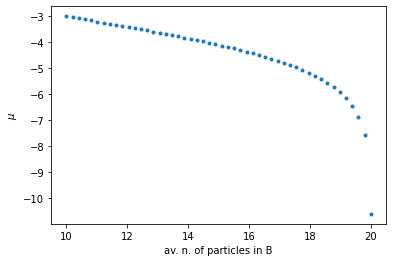

In [31]:
# NBs = np.linspace(1, 20, 4)
# NBs = [0.1, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5]
# NBs = NBs[2:]

NBs = np.linspace(10, 20)

mus = []

for NB in NBs:
    mus.append(infer_mu(OmegaB, NB))

plt.plot(NBs, mus, '.')
plt.xlabel('av. n. of particles in B')
plt.ylabel('$\mu$')

In [59]:
def plot_PA_of_NB(OmegaA, OmegaB, OA, OB, NBlist=None):
    
    if NBlist is None:
        NBlist = []
        NBlist.append(0.1)
        
        for i in range(len(OmegaB) - 2):
            NBlist.append(i + 0.5)
            NBlist.append(i + 1)
        NBlist.append(len(OmegaB) - 1 - 0.5)
        NBlist.append(len(OmegaB) - 1 - 0.1)
    
    for NB in NBlist[2:]:

        mu = infer_mu(OmegaB, NB)
        
        print("real mu, obtained with OmegaB", mu)

        mu_approx = infer_mu(OB, NB)
        
        print("mu estimated, obtained with OB", mu_approx)

        PA_exact = + OmegaA
        for k in range(len(PA_exact)):
                PA_exact[k] *= np.exp(-mu*k)
        PA_exact /= np.sum(PA_exact)

        PA_approx = + OA
        for k in range(len(PA_exact)):
                PA_approx[k] *= np.exp(-mu_approx*k)
        PA_approx /= np.sum(PA_approx)
        
        plt.xlabel("NA")
        plt.plot(PA_exact, label="exact (with mu=" + str (mu) + ")")
        plt.plot(PA_approx, "x", label="approx (with mu=" + str (mu_approx) + ")")
        plt.legend()
        plt.title("Enforcing <NB>=" + str(NB))
        plt.show()

The total n. of particles is constant $N_A + N_B = N$; for low values of the chemical potential $\mu$ (e.g., negative values), a high n. of particles remain in the reservoir (system B), so the n. of particles in system A is lower (?)

Anyway, if $\langle N_B \rangle$ decreases, then $\langle N_A \rangle$ should increase!

real mu, obtained with OmegaB -3.077410304568258
mu estimated, obtained with OB -3.0773664829304095


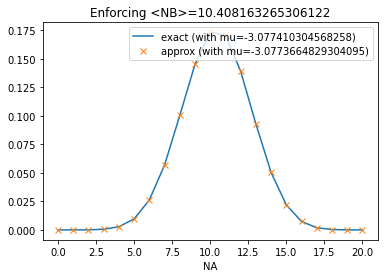

real mu, obtained with OmegaB -3.1183345956463233
mu estimated, obtained with OB -3.118290871781898


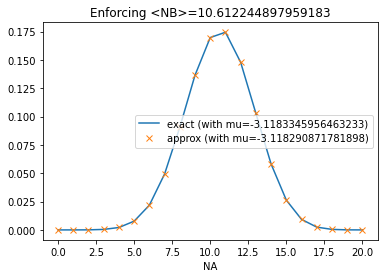

real mu, obtained with OmegaB -3.1593616973357928
mu estimated, obtained with OB -3.159318110164613


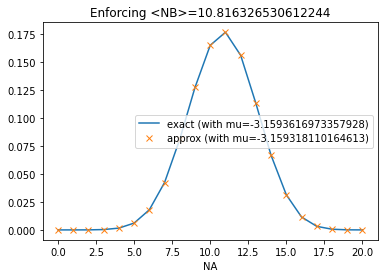

real mu, obtained with OmegaB -3.2005266862000044
mu estimated, obtained with OB -3.200483274809664


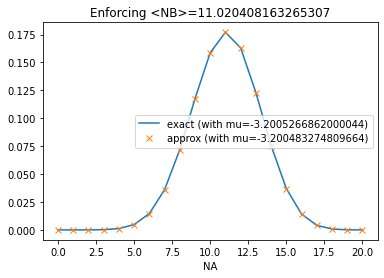

real mu, obtained with OmegaB -3.241865343092899
mu estimated, obtained with OB -3.2418221467871673


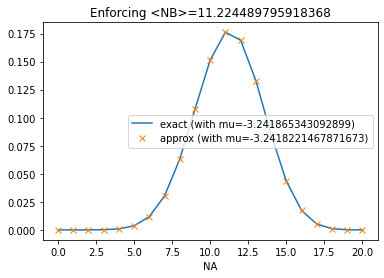

real mu, obtained with OmegaB -3.283414346005772
mu estimated, obtained with OB -3.2833714043495967


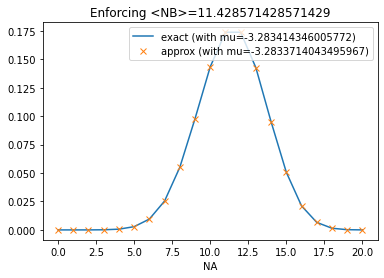

real mu, obtained with OmegaB -3.3252114746842327
mu estimated, obtained with OB -3.325168827544605


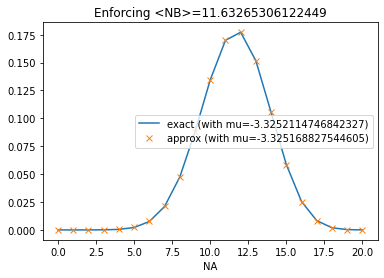

real mu, obtained with OmegaB -3.367295829986474
mu estimated, obtained with OB -3.3672535175683787


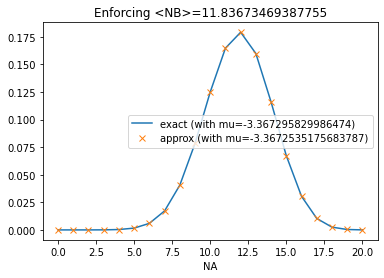

real mu, obtained with OmegaB -3.409708071330064
mu estimated, obtained with OB -3.4096661342068306


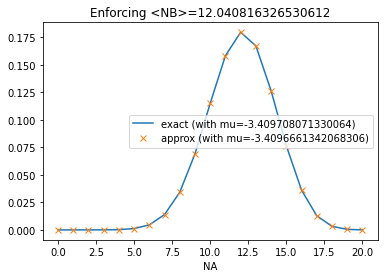

real mu, obtained with OmegaB -3.452490676049706
mu estimated, obtained with OB -3.452449155187036


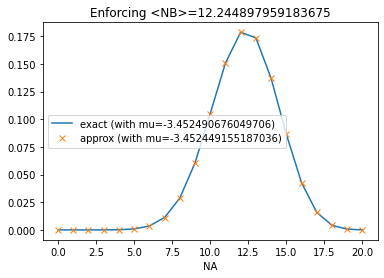

real mu, obtained with OmegaB -3.495688225083078
mu estimated, obtained with OB -3.495647161856113


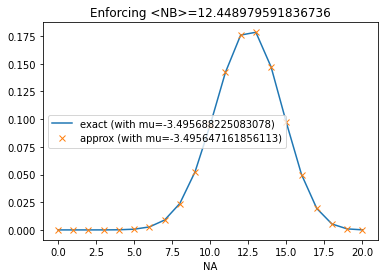

real mu, obtained with OmegaB -3.539347720142973
mu estimated, obtained with OB -3.5393071563457363


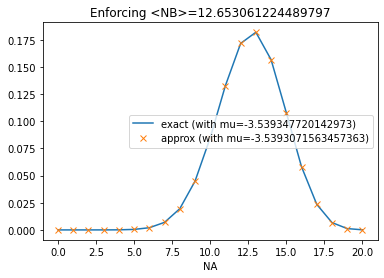

real mu, obtained with OmegaB -3.5835189384561095
mu estimated, obtained with OB -3.583478916302726


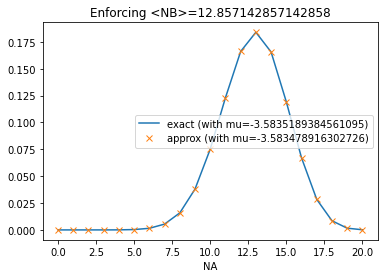

real mu, obtained with OmegaB -3.6282548322975012
mu estimated, obtained with OB -3.628215394414568


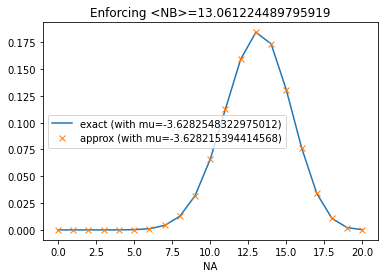

real mu, obtained with OmegaB -3.673611981983148
mu estimated, obtained with OB -3.673573171392694


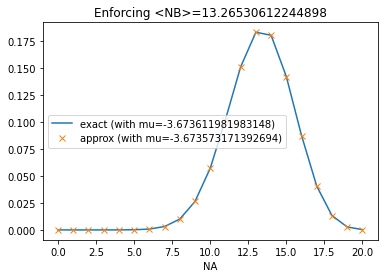

real mu, obtained with OmegaB -3.7196511127806886
mu estimated, obtained with OB -3.7196129728731093


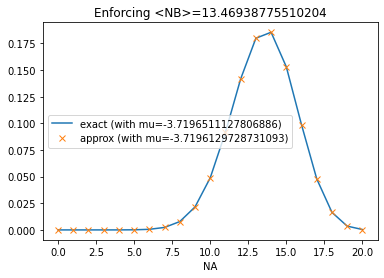

real mu, obtained with OmegaB -3.7664376884598108
mu estimated, obtained with OB -3.7664002629561955


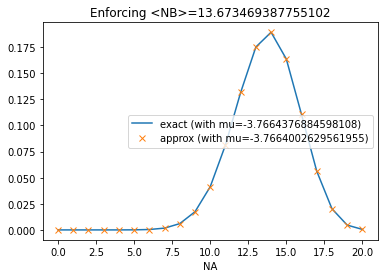

real mu, obtained with OmegaB -3.81404259706794
mu estimated, obtained with OB -3.8140059299711893


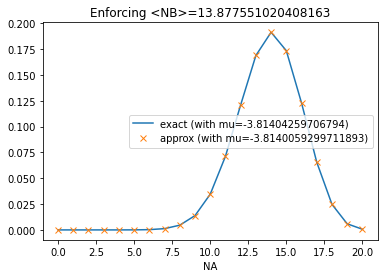

real mu, obtained with OmegaB -3.8625429481647764
mu estimated, obtained with OB -3.862507083698826


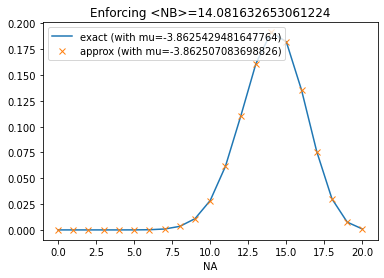

real mu, obtained with OmegaB -3.9120230054281455
mu estimated, obtained with OB -3.9119879879646544


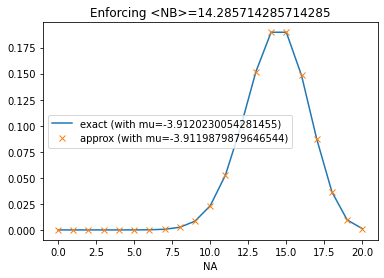

real mu, obtained with OmegaB -3.9625752845909776
mu estimated, obtained with OB -3.9625411585626407


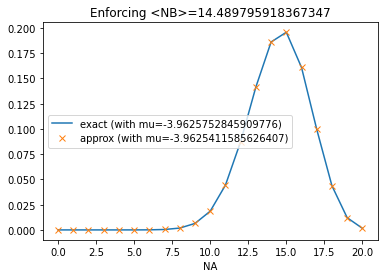

real mu, obtained with OmegaB -4.014301854548563
mu estimated, obtained with OB -4.014268664348233


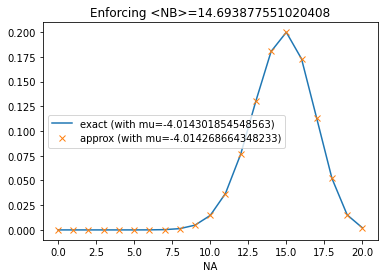

real mu, obtained with OmegaB -4.067315889834181
mu estimated, obtained with OB -4.067283679698775


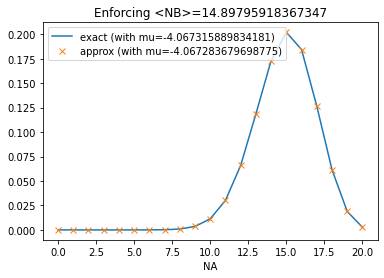

real mu, obtained with OmegaB -4.1217435364102135
mu estimated, obtained with OB -4.1217123502882655


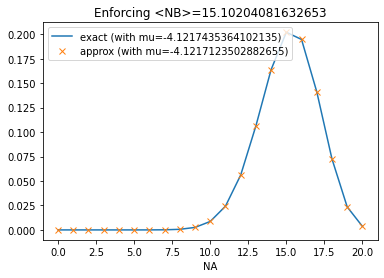

real mu, obtained with OmegaB -4.177726171161151
mu estimated, obtained with OB -4.1776960525626485


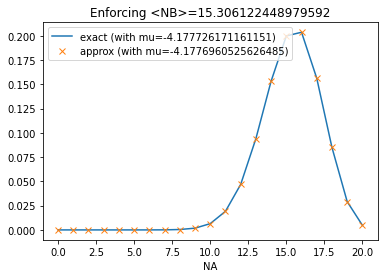

real mu, obtained with OmegaB -4.235423160482005
mu estimated, obtained with OB -4.235394152308947


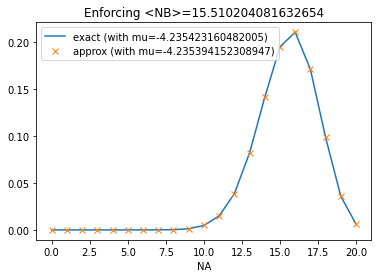

real mu, obtained with OmegaB -4.295015257684252
mu estimated, obtained with OB -4.294987402040026


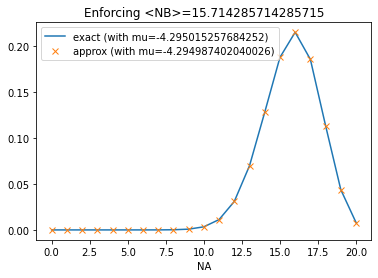

real mu, obtained with OmegaB -4.356708826689592
mu estimated, obtained with OB -4.356682164665008


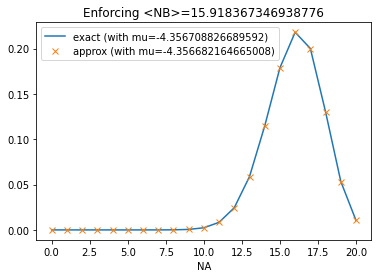

real mu, obtained with OmegaB -4.420741146854572
mu estimated, obtained with OB -4.420715718287893


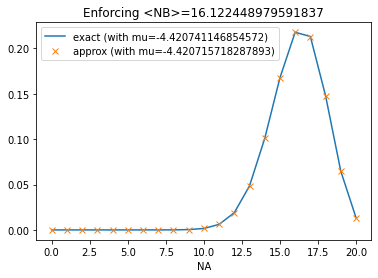

real mu, obtained with OmegaB -4.487387150331706
mu estimated, obtained with OB -4.487362993539639


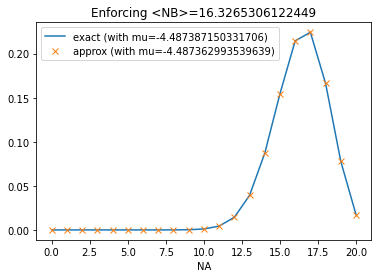

real mu, obtained with OmegaB -4.5569680841702125
mu estimated, obtained with OB -4.556945235646192


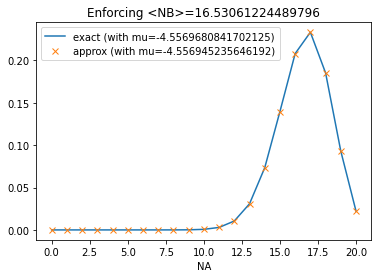

real mu, obtained with OmegaB -4.629862798578462
mu estimated, obtained with OB -4.629841292654015


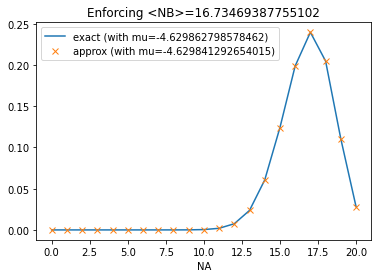

real mu, obtained with OmegaB -4.706522680248377
mu estimated, obtained with OB -4.706502548712523


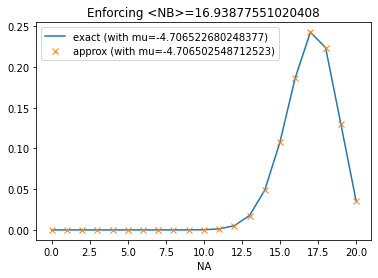

real mu, obtained with OmegaB -4.787491742782044
mu estimated, obtained with OB -4.787473014452904


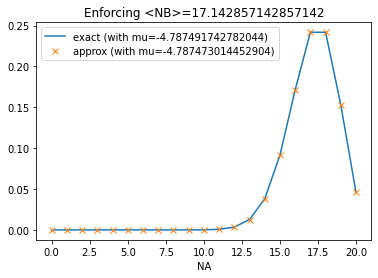

real mu, obtained with OmegaB -4.873434172582769
mu estimated, obtained with OB -4.873416872824601


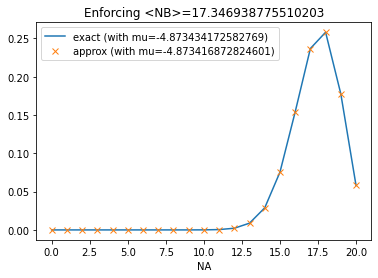

real mu, obtained with OmegaB -4.965172920019496
mu estimated, obtained with OB -4.965157070197203


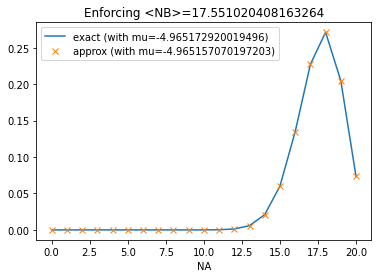

real mu, obtained with OmegaB -5.0637451194102026
mu estimated, obtained with OB -5.063730736272152


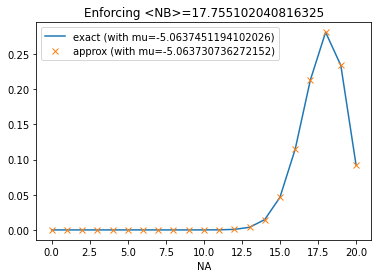

real mu, obtained with OmegaB -5.17048399503815
mu estimated, obtained with OB -5.170471090016694


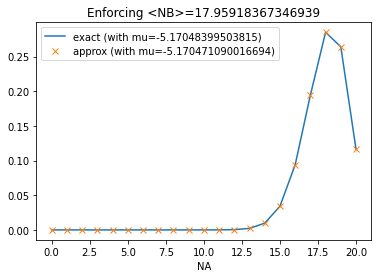

real mu, obtained with OmegaB -5.287144065949908
mu estimated, obtained with OB -5.287132644367359


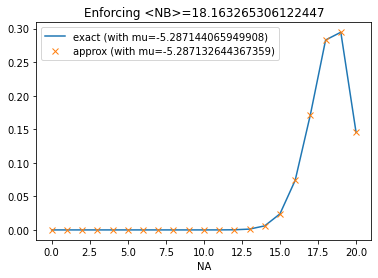

real mu, obtained with OmegaB -5.416100402204419
mu estimated, obtained with OB -5.416090462370375


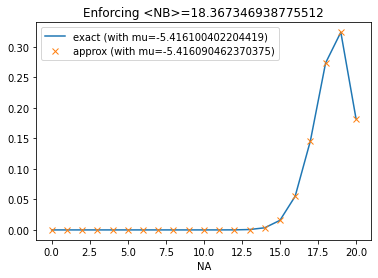

real mu, obtained with OmegaB -5.560681631015522
mu estimated, obtained with OB -5.560673163199401


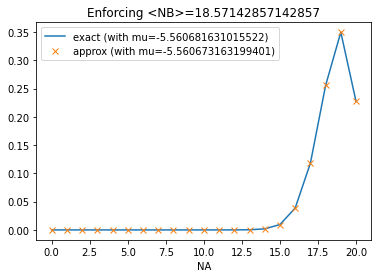

real mu, obtained with OmegaB -5.725761381374972
mu estimated, obtained with OB -5.725754366635175


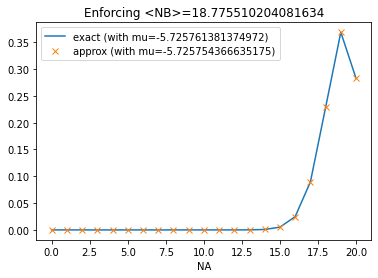

real mu, obtained with OmegaB -5.91889385427314
mu estimated, obtained with OB -5.918888263121661


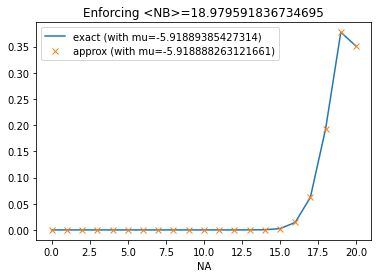

real mu, obtained with OmegaB -6.152732694704098
mu estimated, obtained with OB -6.15272848558239


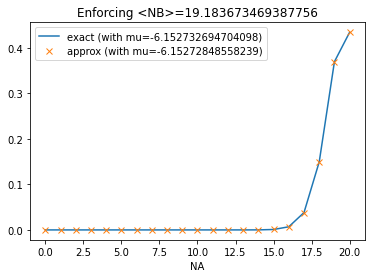

real mu, obtained with OmegaB -6.45099687648641
mu estimated, obtained with OB -6.450993994024878


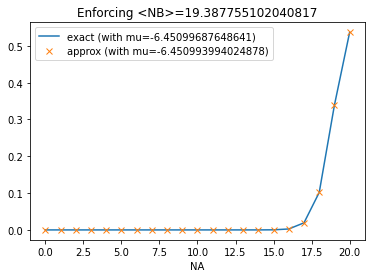

real mu, obtained with OmegaB -6.866933284461868
mu estimated, obtained with OB -6.866931657491684


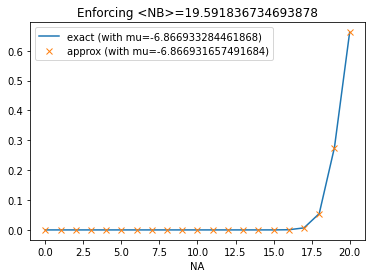

real mu, obtained with OmegaB -7.570443250644727
mu estimated, obtained with OB -7.570442789926165


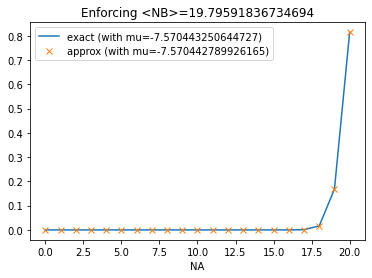

real mu, obtained with OmegaB -10.595246870148022
mu estimated, obtained with OB -10.595247065824177


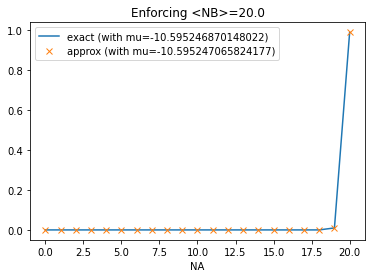

In [60]:
plot_PA_of_NB(OmegaA, OmegaB, OA, OB, NBlist=NBs)

[1.00000000e+00 1.00000000e+00 4.75000000e-01 1.42500000e-01
 3.02812500e-02 4.84500000e-03 6.05625000e-04 6.05625000e-05
 4.92070313e-06 3.28046875e-07 1.80425781e-08 8.20117187e-10
 3.07543945e-11 9.46289063e-13 2.36572266e-14 4.73144531e-16
 7.39288330e-18 8.69750977e-20 7.24792480e-22 3.81469727e-24
 9.53674316e-27]
[1.00000000e+00 9.95249415e-01 4.70497664e-01 1.40478758e-01
 2.97099228e-02 4.73100532e-03 5.88566285e-04 5.85770251e-05
 4.73677343e-06 3.14284733e-07 1.72035433e-08 7.78264382e-10
 2.90462689e-11 8.89485605e-13 2.21315007e-14 4.40527262e-16
 6.85053907e-18 8.02117059e-20 6.65255445e-22 3.48471101e-24
 8.67039149e-27]
[1.00000000e+00 9.90094586e-01 4.65636462e-01 1.38307242e-01
 2.90991660e-02 4.60974827e-03 5.70510850e-04 5.64859704e-05
 4.54402435e-06 2.99934260e-07 1.63329808e-08 7.35054357e-10
 2.72915002e-11 8.31420511e-13 2.05796237e-14 4.07515480e-16
 6.30435734e-18 7.34342362e-20 6.05890330e-22 3.15730914e-24
 7.81508670e-27]
[1.00000000e+00 9.84505713e-01 4.6

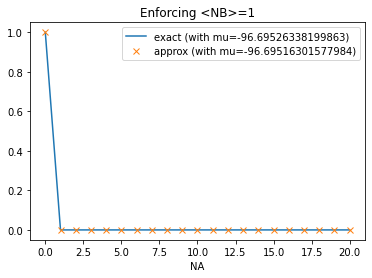

[1.00000000e+00 1.00000000e+00 4.75000000e-01 1.42500000e-01
 3.02812500e-02 4.84500000e-03 6.05625000e-04 6.05625000e-05
 4.92070313e-06 3.28046875e-07 1.80425781e-08 8.20117187e-10
 3.07543945e-11 9.46289063e-13 2.36572266e-14 4.73144531e-16
 7.39288330e-18 8.69750977e-20 7.24792480e-22 3.81469727e-24
 9.53674316e-27]
[1.00000000e+00 9.46710528e-01 4.25723892e-01 1.20911187e-01
 2.43244274e-02 3.68451065e-03 4.36020628e-04 4.12785319e-05
 3.17515419e-06 2.00396793e-07 1.04344765e-08 4.49019488e-10
 1.59409304e-11 4.64352203e-13 1.09901780e-14 2.08090344e-16
 3.07814562e-18 3.42836808e-20 2.70472680e-22 1.34768070e-24
 3.18965878e-27]
[1.00000000e+00 8.91928222e-01 3.77879578e-01 1.01112438e-01
 1.91643204e-02 2.73491171e-03 3.04918117e-04 2.71965074e-05
 1.97090827e-06 1.17193914e-07 5.74907074e-09 2.33079929e-10
 7.79589626e-12 2.13950150e-13 4.77070443e-15 8.51025184e-17
 1.18602091e-18 1.24452414e-20 9.25021835e-23 4.34238463e-25
 9.68273851e-28]
[1.00000000e+00 8.36118726e-01 3.3

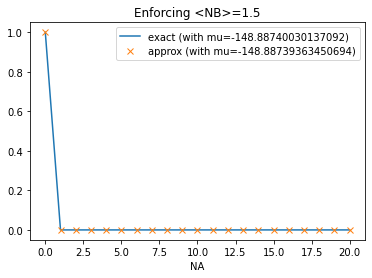

[1.00000000e+00 1.00000000e+00 4.75000000e-01 1.42500000e-01
 3.02812500e-02 4.84500000e-03 6.05625000e-04 6.05625000e-05
 4.92070313e-06 3.28046875e-07 1.80425781e-08 8.20117187e-10
 3.07543945e-11 9.46289063e-13 2.36572266e-14 4.73144531e-16
 7.39288330e-18 8.69750977e-20 7.24792480e-22 3.81469727e-24
 9.53674316e-27]
[1.00000000e+00 9.00538911e-01 3.85210907e-01 1.04069223e-01
 1.99151568e-02 2.86949978e-03 3.23012026e-04 2.90884898e-05
 2.12836950e-06 1.27778637e-07 6.32882990e-09 2.59061708e-10
 8.74856808e-12 2.42413107e-13 5.45756088e-15 9.82949186e-17
 1.38309998e-18 1.46533571e-20 1.09965985e-22 5.21203414e-25
 1.17340989e-27]
[1.00000000e+00 8.03652631e-01 3.06782337e-01 7.39639296e-02
 1.26312777e-02 1.62418552e-03 1.63160121e-04 1.31124060e-05
 8.56197844e-07 4.58723766e-08 2.02760009e-09 7.40675521e-11
 2.23217187e-12 5.51966398e-14 1.10897312e-15 1.78245833e-17
 2.23824582e-19 2.11620252e-21 1.41724310e-23 5.99458499e-26
 1.20439100e-28]
[1.00000000e+00 7.10826124e-01 2.4

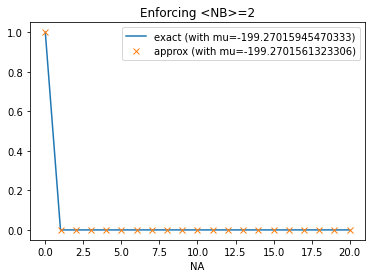

[1.00000000e+00 1.00000000e+00 4.75000000e-01 1.42500000e-01
 3.02812500e-02 4.84500000e-03 6.05625000e-04 6.05625000e-05
 4.92070313e-06 3.28046875e-07 1.80425781e-08 8.20117187e-10
 3.07543945e-11 9.46289063e-13 2.36572266e-14 4.73144531e-16
 7.39288330e-18 8.69750977e-20 7.24792480e-22 3.81469727e-24
 9.53674316e-27]
[1.00000000e+00 8.56619110e-01 3.48553242e-01 8.95732105e-02
 1.63051513e-02 2.23476867e-03 2.39293194e-04 2.04983123e-05
 1.42668874e-06 8.14752560e-08 3.83862937e-09 1.49465603e-10
 4.80131596e-12 1.26550739e-13 2.71014453e-15 4.64312319e-17
 6.21466883e-19 6.26306363e-21 4.47088333e-23 2.01570742e-25
 4.31673374e-28]
[1.00000000e+00 7.24250260e-01 2.49155758e-01 5.41353368e-02
 8.33160050e-03 9.65466213e-04 8.74048944e-05 6.33030175e-06
 3.72508718e-07 1.79859691e-08 7.16448853e-10 2.35858303e-11
 6.40576641e-13 1.42750092e-14 2.58466978e-16 3.74389552e-18
 4.23674578e-20 3.60995792e-22 2.17876080e-24 8.30509515e-27
 1.50374183e-29]
[1.00000000e+00 6.04880540e-01 1.7

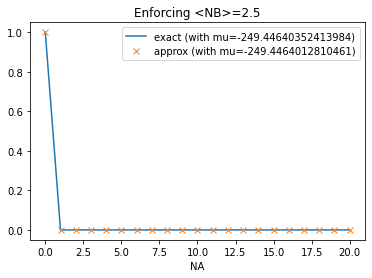

[1.00000000e+00 1.00000000e+00 4.75000000e-01 1.42500000e-01
 3.02812500e-02 4.84500000e-03 6.05625000e-04 6.05625000e-05
 4.92070313e-06 3.28046875e-07 1.80425781e-08 8.20117187e-10
 3.07543945e-11 9.46289063e-13 2.36572266e-14 4.73144531e-16
 7.39288330e-18 8.69750977e-20 7.24792480e-22 3.81469727e-24
 9.53674316e-27]
[1.00000000e+00 8.14841303e-01 3.15384016e-01 7.70963768e-02
 1.33495288e-02 1.74043959e-03 1.77272758e-04 1.44449165e-05
 9.56338063e-07 5.19509169e-08 2.32824641e-09 8.62341516e-11
 2.63501807e-12 6.60652786e-14 1.34581794e-15 2.19325609e-17
 2.79243071e-19 2.67692691e-21 1.81772551e-23 7.79556750e-26
 1.58803760e-28]
[1.00000000e+00 6.52810987e-01 2.02427038e-01 3.96439784e-02
 5.49950524e-03 5.74421991e-04 4.68736234e-05 3.05996164e-06
 1.62303097e-07 7.06354967e-09 2.53613956e-10 7.52554441e-12
 1.84228428e-13 3.70050283e-15 6.03932226e-17 7.88507185e-19
 8.04290866e-21 6.17705782e-23 3.36037601e-25 1.15457388e-27
 1.88429629e-30]
[1.00000000e+00 5.15174292e-01 1.2

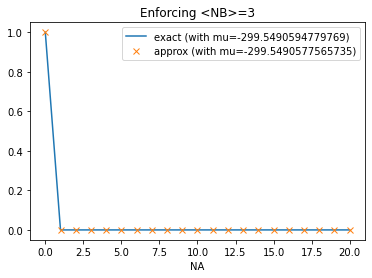

[1.00000000e+00 1.00000000e+00 4.75000000e-01 1.42500000e-01
 3.02812500e-02 4.84500000e-03 6.05625000e-04 6.05625000e-05
 4.92070313e-06 3.28046875e-07 1.80425781e-08 8.20117187e-10
 3.07543945e-11 9.46289063e-13 2.36572266e-14 4.73144531e-16
 7.39288330e-18 8.69750977e-20 7.24792480e-22 3.81469727e-24
 9.53674316e-27]
[1.00000000e+00 7.75101024e-01 2.85371259e-01 6.63574664e-02
 1.09296698e-02 1.35545572e-03 1.31326889e-04 1.01791606e-05
 6.41052574e-07 3.31253671e-08 1.41215283e-09 4.97527774e-11
 1.44612858e-12 3.44890997e-14 6.68313412e-16 1.03602082e-17
 1.25472000e-19 1.14415853e-21 7.39032043e-24 3.01486575e-26
 5.84206383e-29]
[1.00000000e+00 5.88520430e-01 1.64519241e-01 2.90468803e-02
 3.63262003e-03 3.42059377e-04 2.51636165e-05 1.48093024e-06
 7.08140632e-08 2.77836820e-09 8.99319545e-11 2.40576330e-12
 5.30940319e-14 9.61443769e-16 1.41457325e-17 1.66501052e-19
 1.53108235e-21 1.06008617e-23 5.19901974e-26 1.61038386e-28
 2.36935951e-31]
[1.00000000e+00 4.39123812e-01 9.1

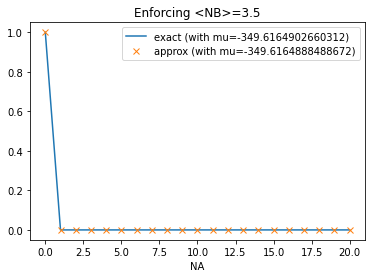

[1.00000000e+00 1.00000000e+00 4.75000000e-01 1.42500000e-01
 3.02812500e-02 4.84500000e-03 6.05625000e-04 6.05625000e-05
 4.92070313e-06 3.28046875e-07 1.80425781e-08 8.20117187e-10
 3.07543945e-11 9.46289063e-13 2.36572266e-14 4.73144531e-16
 7.39288330e-18 8.69750977e-20 7.24792480e-22 3.81469727e-24
 9.53674316e-27]
[1.00000000e+00 7.37298901e-01 2.58214593e-01 5.71144007e-02
 8.94845677e-03 1.05562998e-03 9.72893525e-05 7.17313327e-06
 4.29710391e-07 2.11216666e-08 8.56513986e-10 2.87048555e-11
 7.93652190e-13 1.80048888e-14 3.31874619e-16 4.89381583e-18
 5.63782037e-20 4.89030442e-22 3.00468006e-24 1.16597227e-26
 2.14917518e-29]
[1.00000000e+00 5.30649567e-01 1.33754757e-01 2.12930712e-02
 2.40107129e-03 2.03860391e-04 1.35223035e-05 7.17560450e-07
 3.09378178e-08 1.09447597e-09 3.19430761e-11 7.70480886e-13
 1.53320756e-14 2.50337208e-16 3.32103327e-18 3.52460974e-20
 2.92239474e-22 1.82443235e-24 8.06778532e-27 2.25324568e-29
 2.98920961e-32]
[1.00000000e+00 3.74576201e-01 6.6

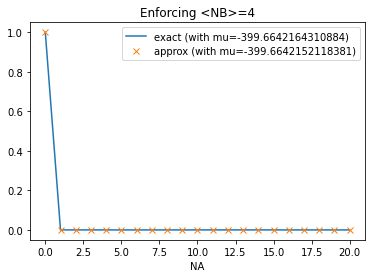

[1.00000000e+00 1.00000000e+00 4.75000000e-01 1.42500000e-01
 3.02812500e-02 4.84500000e-03 6.05625000e-04 6.05625000e-05
 4.92070313e-06 3.28046875e-07 1.80425781e-08 8.20117187e-10
 3.07543945e-11 9.46289063e-13 2.36572266e-14 4.73144531e-16
 7.39288330e-18 8.69750977e-20 7.24792480e-22 3.81469727e-24
 9.53674316e-27]
[1.00000000e+00 7.01340409e-01 2.33642226e-01 4.91588202e-02
 7.32637675e-03 8.22125451e-04 7.20737250e-05 5.05482158e-06
 2.88043489e-07 1.34677692e-08 5.19501993e-10 1.65612609e-11
 4.35565557e-13 9.39937618e-15 1.64804058e-16 2.31167492e-18
 2.53323599e-20 2.09018913e-22 1.22161175e-24 4.50929308e-27
 7.90637364e-30]
[1.00000000e+00 4.78545524e-01 1.08777764e-01 1.56165336e-02
 1.58805973e-03 1.21593420e-04 7.27349834e-06 3.48070008e-07
 1.35335967e-08 4.31762808e-10 1.13639988e-11 2.47190488e-13
 4.43594631e-15 6.53169924e-17 7.81428858e-19 7.47898564e-21
 5.59224235e-23 3.14840299e-25 1.25554513e-27 3.16229212e-30
 3.78325185e-33]
[1.00000000e+00 3.19733433e-01 4.8

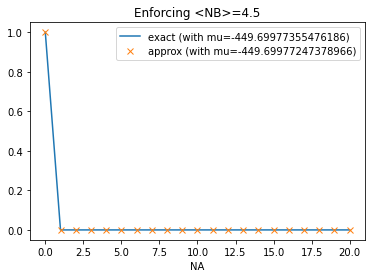

[1.00000000e+00 1.00000000e+00 4.75000000e-01 1.42500000e-01
 3.02812500e-02 4.84500000e-03 6.05625000e-04 6.05625000e-05
 4.92070313e-06 3.28046875e-07 1.80425781e-08 8.20117187e-10
 3.07543945e-11 9.46289063e-13 2.36572266e-14 4.73144531e-16
 7.39288330e-18 8.69750977e-20 7.24792480e-22 3.81469727e-24
 9.53674316e-27]
[1.00000000e+00 6.67135634e-01 2.11408228e-01 4.23113887e-02
 5.99832996e-03 6.40271945e-04 5.33935287e-05 3.56207256e-06
 1.93081325e-07 8.58742880e-09 3.15093887e-10 9.55501635e-12
 2.39043446e-13 4.90690464e-15 8.18392734e-17 1.09195791e-18
 1.13825630e-20 8.93378046e-23 4.96670274e-25 1.74392862e-27
 2.90859231e-30]
[1.00000000e+00 4.31623389e-01 8.84919060e-02 1.14585529e-02
 1.05097813e-03 7.25802786e-05 3.91591822e-06 1.69020189e-07
 5.92743668e-09 1.70561354e-10 4.04900482e-12 7.94384173e-14
 1.28578046e-15 1.70760898e-17 1.84260993e-19 1.59062708e-21
 1.07273727e-23 5.44727641e-26 1.95930992e-28 4.45096835e-31
 4.80285510e-34]
[1.00000000e+00 2.73090692e-01 3.5

KeyboardInterrupt: 

In [47]:
plot_PA_of_NB(OmegaA, OmegaB, OA, OB)

PA at fixed NB is correct, at least if NB is small enough.

### Impact of limited Ns

I want to better understand the impact of using a limited number of Ns.

put in cell hist2d[k, n-k] the A[k] value; since A[k] is computed with input values N which is N[n] = 1 only for a given n, then $A[k] = P_A(n)_k$

(k is the n. of particles in sub-system A, N-k the n. of particles in sub-system B)

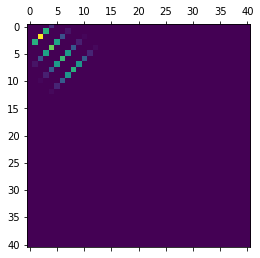

In [87]:
hist2d = np.zeros((S + 1, S + 1))

for n in range(0, (S + 1)//2, 4):
    N = {}
    N[n] = 1
    
    A, B = generate_histograms(OmegaA, OmegaB, N)

    for k in range(min(n, len(A))):
        hist2d[k, n - k] = A[k]
        
plt.matshow(hist2d)
plt.show()


check which cells are zero

/u/i/igilardo/.local/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.


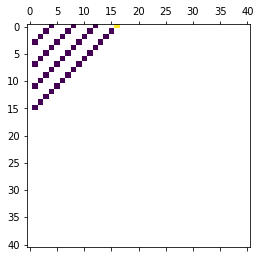

In [85]:
plt.matshow(1/hist2d)


In [39]:
N = {}
for n in range(0, (S + 1)//2, 4):
    N[n] = 1

A, B = generate_histograms(OmegaA, OmegaB, N)
OA, OB = solve(A, B, N)

# iterations 99999


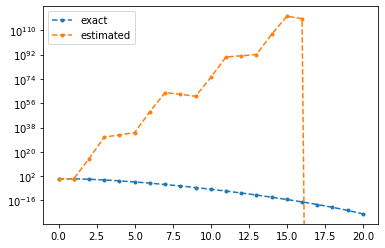

In [40]:
plt.plot(OmegaA, '.--', label='exact')
plt.plot(OA, '.--', label='estimated')

plt.yscale("log")
plt.legend()

impact of considering only some n as total n. of particles in A+B system; increasing delta, i.e., reducing the set of n values, the estimated $\Omega_A$ moves away from the exact solution

# iterations 118
# iterations 260
# iterations 145
# iterations 1152
# iterations 618
# iterations 99999
# iterations 99999
# iterations 99999


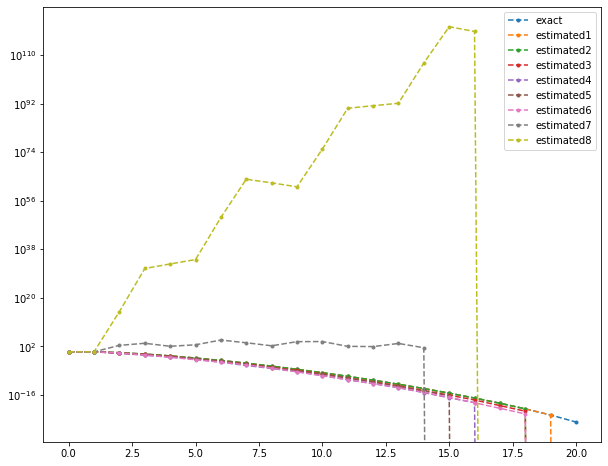

In [91]:
deltas = [1, 2, 3, 4, 5, 6, 7, 8]

plt.figure(figsize=(10, 8))
plt.plot(OmegaA, '.--', label='exact')

OA = {}
OB = {}

for delta in deltas:
    N = {}
    for n in range(0, (S + 1)//2, delta):
        N[n] = 1

    A, B = generate_histograms(OmegaA, OmegaB, N)
    OA[delta], OB[delta] = solve(A, B, N)

    plt.plot(OA[delta], '.--', label='estimated' + str(delta))

plt.yscale("log")
plt.legend()

/u/i/igilardo/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  
/u/i/igilardo/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  
/u/i/igilardo/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  
/u/i/igilardo/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  
/u/i/igilardo/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  
/u/i/igilardo/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  
/u/i/igilardo/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  
/u/i/igilardo/.local/lib/python3.6/site-packages/ipyker

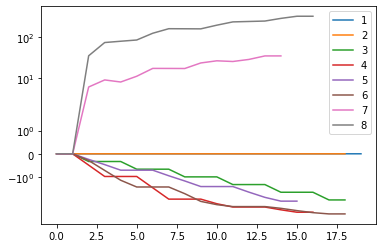

In [53]:
for delta in deltas:
    plt.plot(-np.log(OmegaA/OA[delta]), label=delta)

plt.legend()
plt.yscale('symlog')

In the worst case, if you have simulated the A+B system only at total n. of particles n, then you cannot get any information about the grand-canonical ensemble (?)

/u/i/igilardo/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in double_scalars
/u/i/igilardo/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


# iterations 99999
# iterations 99999
# iterations 99999
# iterations 99999
# iterations 99999


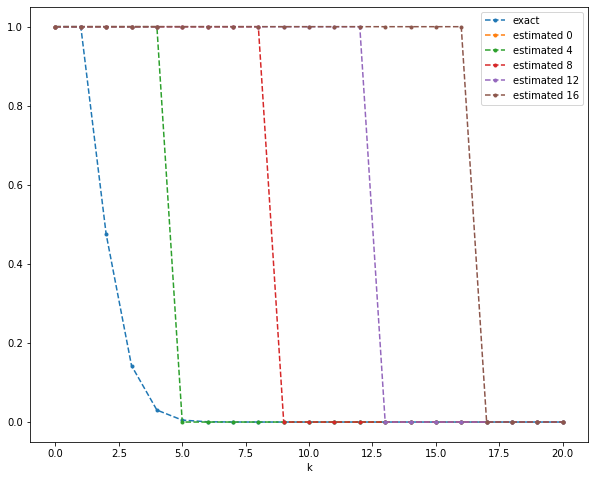

In [92]:
delta = 4

plt.figure(figsize=(10, 8))
plt.plot(OmegaA, '.--', label='exact')

OA = {}
OB = {}

for n in range(0, (S + 1)//2, delta):
    N = {}
    N[n] = 1

    A, B = generate_histograms(OmegaA, OmegaB, N)
    OA[n], OB[n] = solve(A, B, N)

    plt.plot(OA[n], '.--', label='estimated ' + str(n))

plt.xlabel('k')
# plt.yscale("log")
plt.legend()

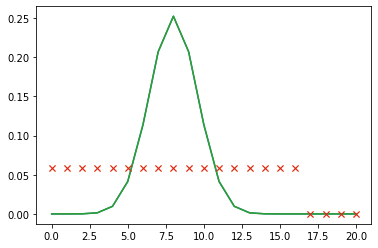

In [93]:
Ap, Bp = generate_histograms(OA[n], OB[n], N)
plt.plot(A)
plt.plot(Ap, "x")
plt.plot(B)
plt.plot(Bp, "x")

the same as below but with OA, OB (estimated) rather than OmegaA, OmegaB (exact)

In [94]:
OA = OA[n]
OB = OB[n]

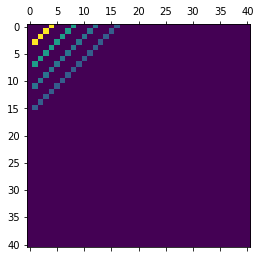

In [95]:
hist2d = np.zeros((S + 1, S + 1))

for n in range(0, (S + 1)//2, 4):
    N = {}
    N[n] = 1
    
    A, B = generate_histograms(OA, OB, N)

    for k in range(min(n, len(A))):
        hist2d[k, n - k] = A[k]
        
plt.matshow(hist2d)
plt.show()


## 2. Adding a stabilized site

I now try a more complicated system. Since the tools above only use OmegaA and OmegaB it is sufficient to precompute them correctly.

In particular, I here assume there is a single site in region A with high stability (probability is 100 times larger than other sites).

In [100]:
Sa = 20
Sb = 20
Stot = Sa + Sb

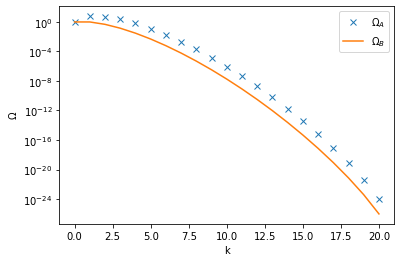

In [97]:
OmegaA = []
OmegaB = []

stability = 100

for i in range(Sa + 1):
    OmegaA.append(comb(Sa - 1, i) + comb(Sa - 1, i - 1)*stability)

for i in range(Sb + 1):
    OmegaB.append(comb(Sb, i))

OmegaA, OmegaB = normalize(OmegaA, OmegaB)

plt.plot(OmegaA, "x", label="$\Omega_A$")
plt.plot(OmegaB, label="$\Omega_B$")
plt.xlabel("k")
plt.ylabel("$\Omega$")
plt.legend()
plt.yscale("log")
plt.show()

The jump going from $N_A=0$ to $N_A=1$ correspond to the energy gained occupying the stabilized site.

In [112]:
L = {}

for n in range(1, (Stot + 1)//2, 4):
    L[n] = 1

# iterations 99999


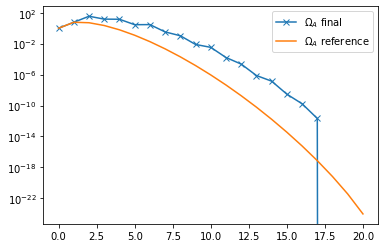

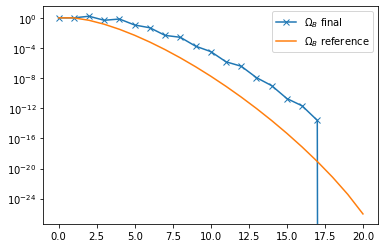

In [113]:
A, B = generate_histograms(OmegaA, OmegaB, L)
OA, OB = solve(A, B, L)

plt.plot(OA, "x-", label="$\Omega_A$ final")
plt.plot(OmegaA, "-", label="$\Omega_A$ reference")
plt.legend()
plt.yscale("log")
plt.show()
plt.plot(OB, "x-", label="$\Omega_B$ final")
plt.plot(OmegaB, "-", label="$\Omega_B$ reference")
plt.legend()
plt.yscale("log")
plt.show()

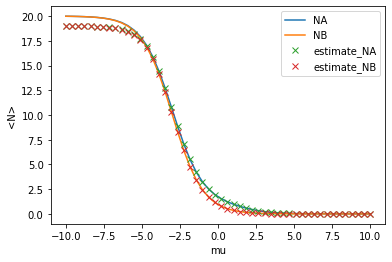

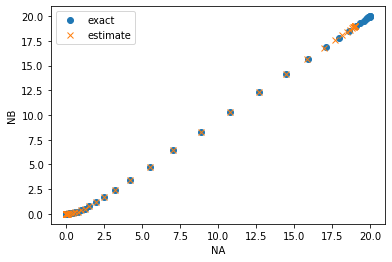

In [110]:
plot_N_of_mu(OmegaA, OmegaB, OA, OB)

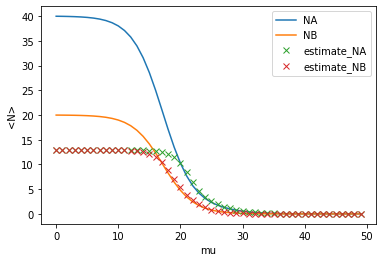

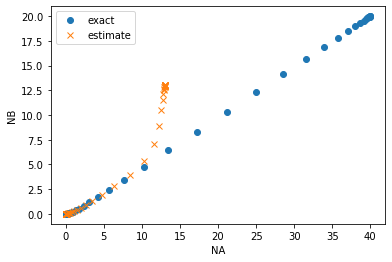

In [23]:
plot_N_of_mu(OmegaA, OmegaB, OA, OB)

real mu, obtained with OmegaB 2.297531701618791
mu estimated, obtained with OB 2.2975320759188325


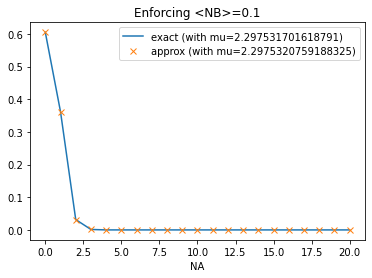

real mu, obtained with OmegaB 0.6678293725756533
mu estimated, obtained with OB 0.6678312243596551


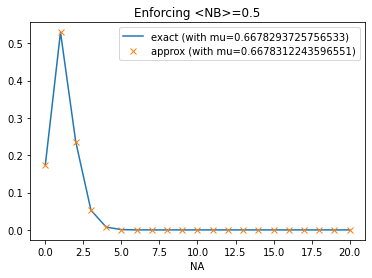

real mu, obtained with OmegaB -0.05129329438754927
mu estimated, obtained with OB -0.051289660215541516


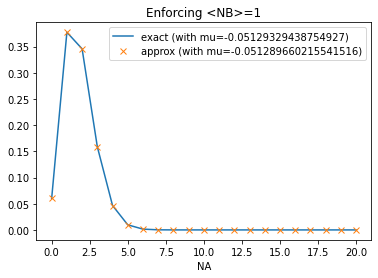

real mu, obtained with OmegaB -0.4834266495778757
mu estimated, obtained with OB -0.4834213296528787


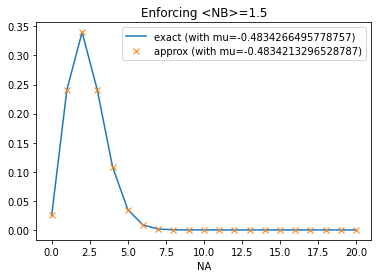

real mu, obtained with OmegaB -0.798507696217771
mu estimated, obtained with OB -0.7985008035737837


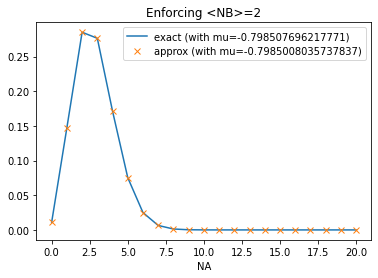

real mu, obtained with OmegaB -1.0498221244986776
mu estimated, obtained with OB -1.0498137812543968


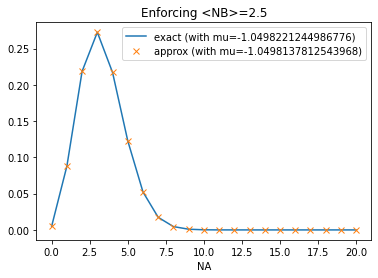

real mu, obtained with OmegaB -1.2611312181658845
mu estimated, obtained with OB -1.2611215505697388


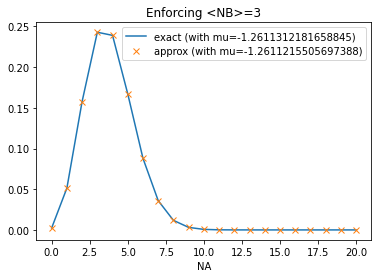

real mu, obtained with OmegaB -1.4451348611428236
mu estimated, obtained with OB -1.4451239961906606


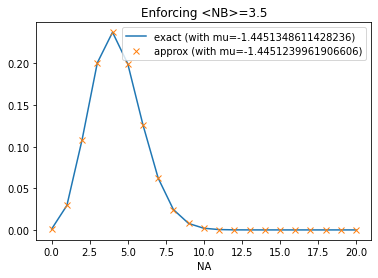

real mu, obtained with OmegaB -1.6094379124341
mu estimated, obtained with OB -1.609425975544964


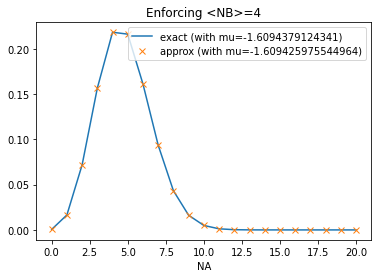

real mu, obtained with OmegaB -1.7589696464050641
mu estimated, obtained with OB -1.7589567598305857


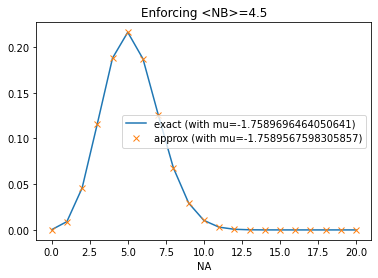

real mu, obtained with OmegaB -1.8971199848858806
mu estimated, obtained with OB -1.897106266657831


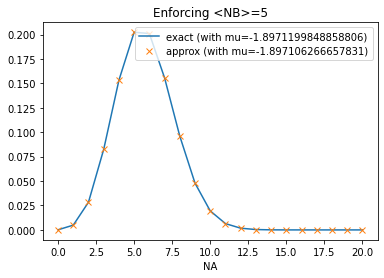

real mu, obtained with OmegaB -2.026331716365887
mu estimated, obtained with OB -2.0263172796737976


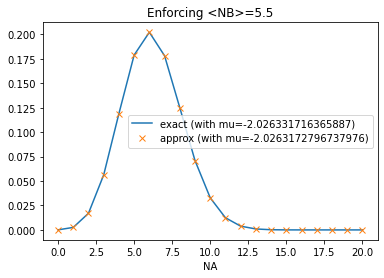

real mu, obtained with OmegaB -2.148434413166787
mu estimated, obtained with OB -2.148419366127661


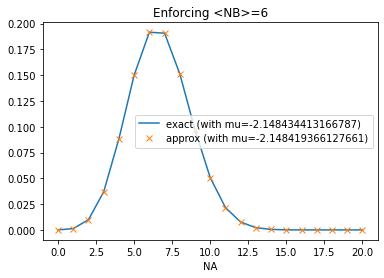

real mu, obtained with OmegaB -2.2648447650111985
mu estimated, obtained with OB -2.2648292108930614


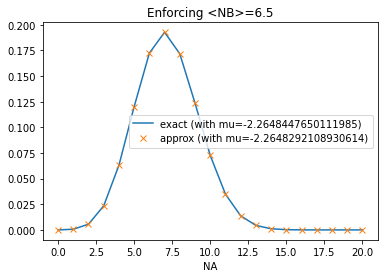

real mu, obtained with OmegaB -2.3766930651477676
mu estimated, obtained with OB -2.3766771033493272


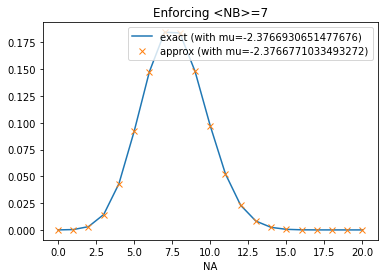

real mu, obtained with OmegaB -2.4849066497880004
mu estimated, obtained with OB -2.4848903785290526


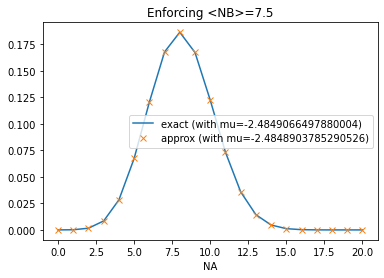

real mu, obtained with OmegaB -2.5902671654458267
mu estimated, obtained with OB -2.5902506888206593


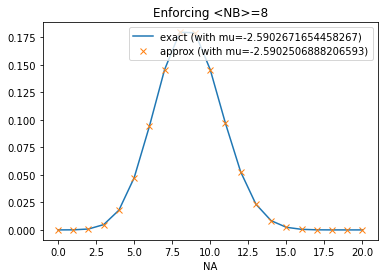

real mu, obtained with OmegaB -2.693451401681057
mu estimated, obtained with OB -2.6934348478701797


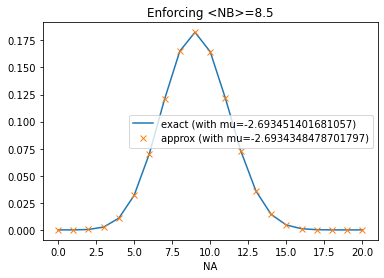

real mu, obtained with OmegaB -2.7950615780918397
mu estimated, obtained with OB -2.795045145049676


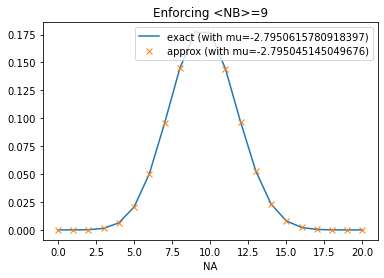

real mu, obtained with OmegaB -2.895648814997008
mu estimated, obtained with OB -2.8956328806906373


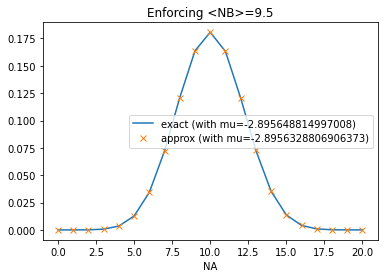

real mu, obtained with OmegaB -2.995732273553991
mu estimated, obtained with OB -2.9957176510189267


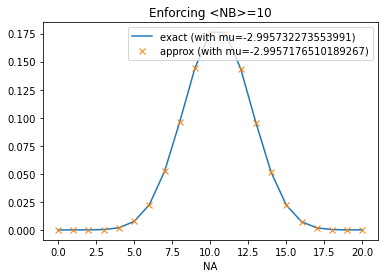

real mu, obtained with OmegaB -3.0958157321109736
mu estimated, obtained with OB -3.0958042358375564


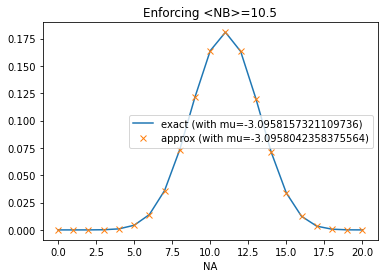

real mu, obtained with OmegaB -3.196402969016142
mu estimated, obtained with OB -3.1963986252523284


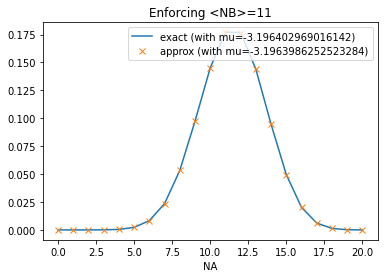

real mu, obtained with OmegaB -3.298013145426924
mu estimated, obtained with OB -3.298024688706287


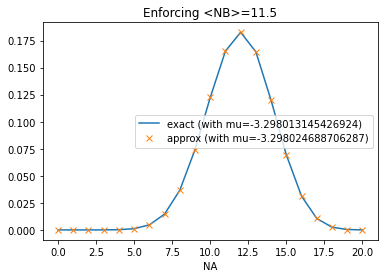

real mu, obtained with OmegaB -3.401197381662155
mu estimated, obtained with OB -3.401243241946214


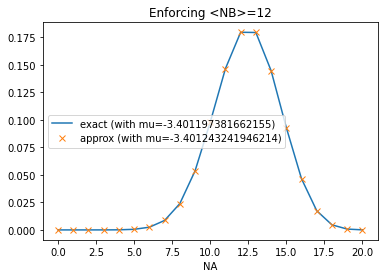

real mu, obtained with OmegaB -3.506557897319982
mu estimated, obtained with OB -3.506675880268922


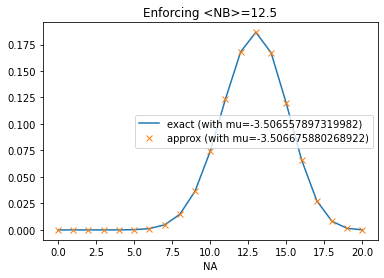

real mu, obtained with OmegaB -3.6147714819602146
mu estimated, obtained with OB -3.6150370921164923


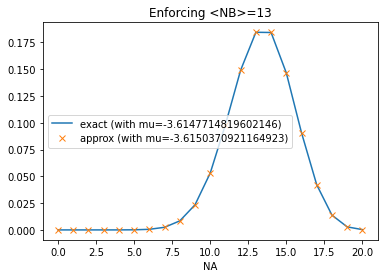

real mu, obtained with OmegaB -3.7266197820967832
mu estimated, obtained with OB -3.7271801857911755


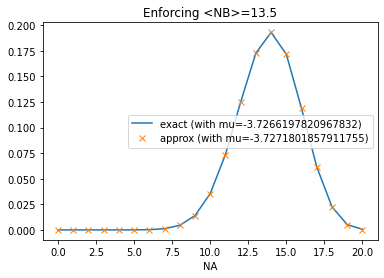

real mu, obtained with OmegaB -3.8430301339411934
mu estimated, obtained with OB -3.844166129538371


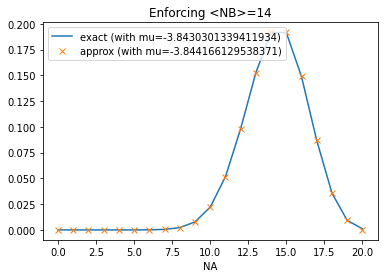

real mu, obtained with OmegaB -3.9651328307420943
mu estimated, obtained with OB -3.967370941039441


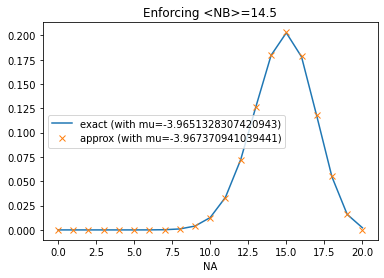

real mu, obtained with OmegaB -4.0943445622221
mu estimated, obtained with OB -4.098659953035785


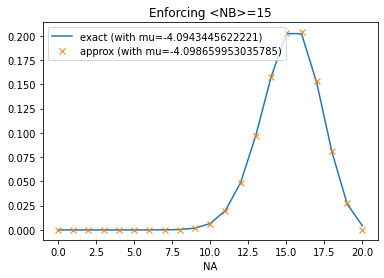

real mu, obtained with OmegaB -4.232494900702916
mu estimated, obtained with OB -4.240683796650369


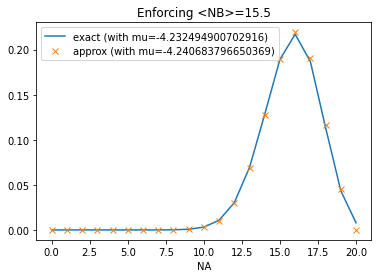

real mu, obtained with OmegaB -4.38202663467388
mu estimated, obtained with OB -4.397411269521872


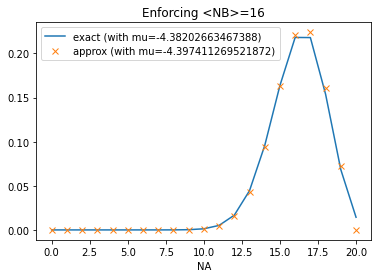

real mu, obtained with OmegaB -4.546329685965156
mu estimated, obtained with OB -4.575166047292819


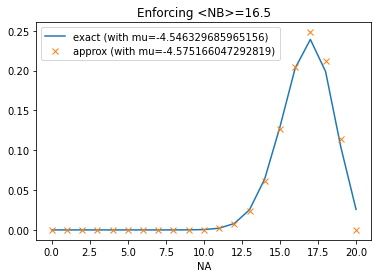

real mu, obtained with OmegaB -4.730333328942096
mu estimated, obtained with OB -4.784868118459512


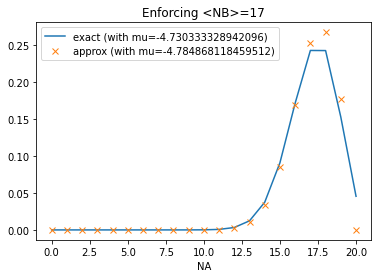

real mu, obtained with OmegaB -4.941642422609301
mu estimated, obtained with OB -5.047658947660378


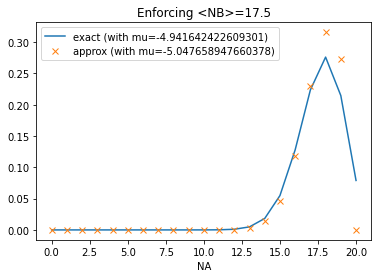

real mu, obtained with OmegaB -5.192956850890209
mu estimated, obtained with OB -5.4126490625710195


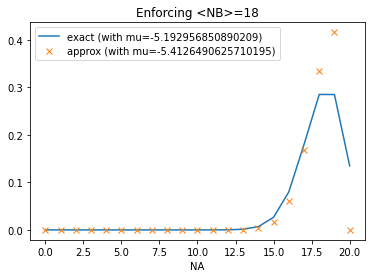

real mu, obtained with OmegaB -5.508037897530102
mu estimated, obtained with OB -6.04233460197739


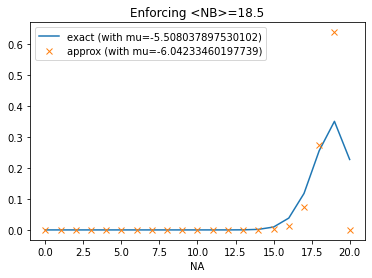

real mu, obtained with OmegaB -5.9401712527204245
mu estimated, obtained with OB -9.867656674942433


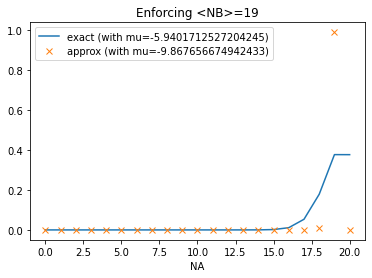

real mu, obtained with OmegaB -6.659293919683628
mu estimated, obtained with OB nan


/u/i/igilardo/.local/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: overflow encountered in exp
  if __name__ == '__main__':
/u/i/igilardo/.local/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in double_scalars
  if __name__ == '__main__':


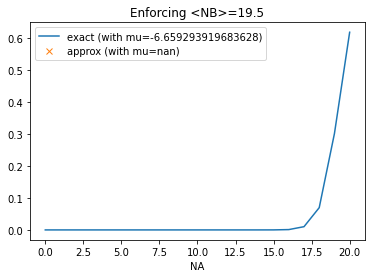

real mu, obtained with OmegaB -8.288991048137342
mu estimated, obtained with OB nan


/u/i/igilardo/.local/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: overflow encountered in exp
  if __name__ == '__main__':
/u/i/igilardo/.local/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in double_scalars
  if __name__ == '__main__':


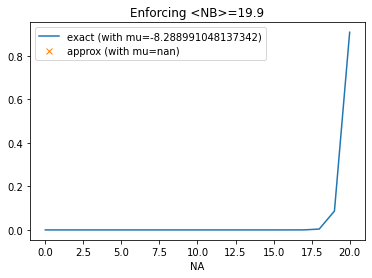

In [111]:
plot_PA_of_NB(OmegaA, OmegaB, OA, OB)

## 3. Multiple stabilizing sites

I here assume to have three stabilized sites. There is also a cooperative effect between site 0 and site 1. Binding to site 2 instead is independent.

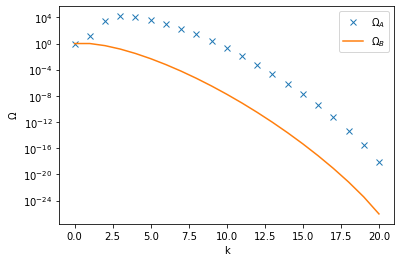

In [59]:
OmegaA = []
OmegaB = []

stability0 = 100
stability1 = 100
stability2 = 100

cooperativity01 = 100

for i in range(Sa + 1):
    OmegaA.append(
        comb(Sa - 3, i)+
        comb(Sa - 3, i - 1)*(stability0 + stability1 + stability2) +
        comb(Sa - 3, i - 2)*(stability0*stability1*cooperativity01 + stability0*stability2 + stability1*stability2) +
        comb(Sa - 3, i - 3)*(stability0*stability1*cooperativity01*stability2)
    )

for i in range(Sb + 1):
    OmegaB.append(comb(Sb, i))
OmegaA, OmegaB = normalize(OmegaA, OmegaB)

plt.plot(OmegaA, "x", label="$\Omega_A$")
plt.plot(OmegaB, label="$\Omega_B$")
plt.xlabel("k")
plt.ylabel("$\Omega$")
plt.legend()
plt.yscale("log")
plt.show()

# iterations 3269


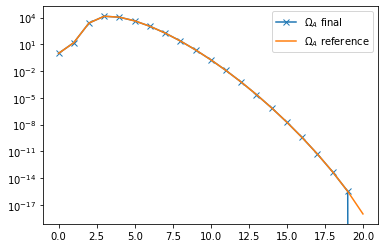

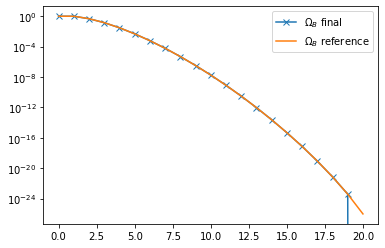

In [60]:
A, B = generate_histograms(OmegaA, OmegaB, L)
OA, OB = solve(A, B, L)

plt.plot(OA, "x-", label="$\Omega_A$ final")
plt.plot(OmegaA, "-", label="$\Omega_A$ reference")
plt.legend()
plt.yscale("log")
plt.show()
plt.plot(OB, "x-", label="$\Omega_B$ final")
plt.plot(OmegaB, "-", label="$\Omega_B$ reference")
plt.legend()
plt.yscale("log")
plt.show()

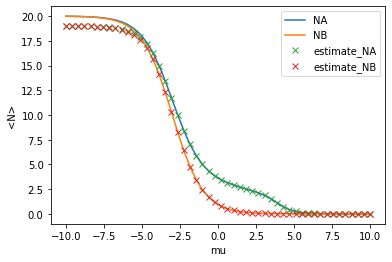

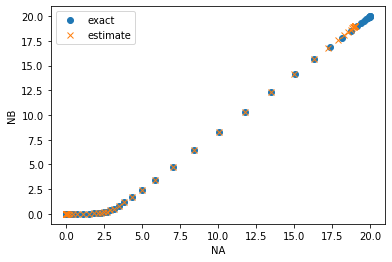

(array([-10.        ,  -9.59183673,  -9.18367347,  -8.7755102 ,
         -8.36734694,  -7.95918367,  -7.55102041,  -7.14285714,
         -6.73469388,  -6.32653061,  -5.91836735,  -5.51020408,
         -5.10204082,  -4.69387755,  -4.28571429,  -3.87755102,
         -3.46938776,  -3.06122449,  -2.65306122,  -2.24489796,
         -1.83673469,  -1.42857143,  -1.02040816,  -0.6122449 ,
         -0.20408163,   0.20408163,   0.6122449 ,   1.02040816,
          1.42857143,   1.83673469,   2.24489796,   2.65306122,
          3.06122449,   3.46938776,   3.87755102,   4.28571429,
          4.69387755,   5.10204082,   5.51020408,   5.91836735,
          6.32653061,   6.73469388,   7.14285714,   7.55102041,
          7.95918367,   8.36734694,   8.7755102 ,   9.18367347,
          9.59183673,  10.        ]),
 [19.984568765505724,
  19.976801211744228,
  19.96513175524872,
  19.947610420436956,
  19.921325374960514,
  19.881944277631547,
  19.823056594114014,
  19.73525507159203,
  19.604907273782228

In [63]:
plot_N_of_mu(OmegaA, OmegaB, OA, OB)

real mu, obtained with OmegaB 2.297531701618791
mu estimated, obtained with OB 2.247435285530822


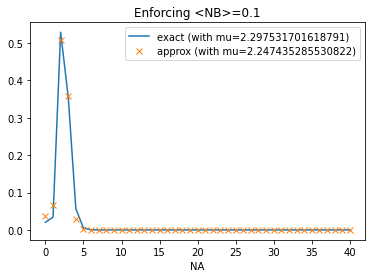

real mu, obtained with OmegaB 0.6678293725756533
mu estimated, obtained with OB 0.4504579367726261


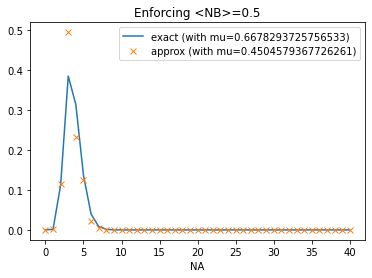

real mu, obtained with OmegaB -0.05129329438754926
mu estimated, obtained with OB -0.3779975251794167


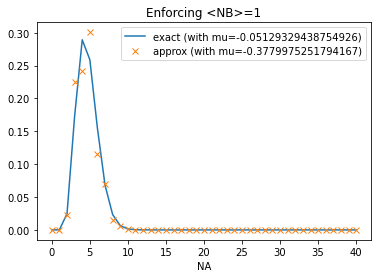

real mu, obtained with OmegaB -0.4834266495778757
mu estimated, obtained with OB -0.8491507404028387


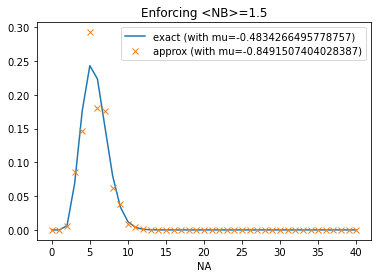

real mu, obtained with OmegaB -0.798507696217771
mu estimated, obtained with OB -1.1769327931337779


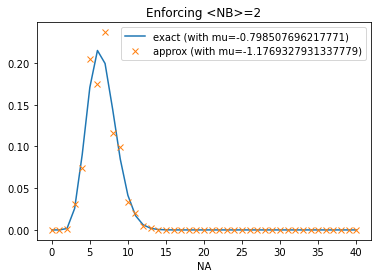

real mu, obtained with OmegaB -1.0498221244986776
mu estimated, obtained with OB -1.4322281334477216


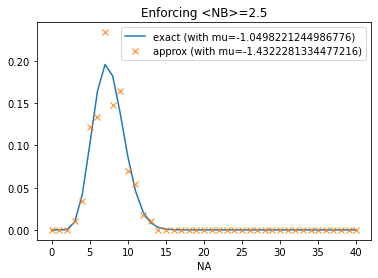

real mu, obtained with OmegaB -1.2611312181658845
mu estimated, obtained with OB -1.6447221706875628


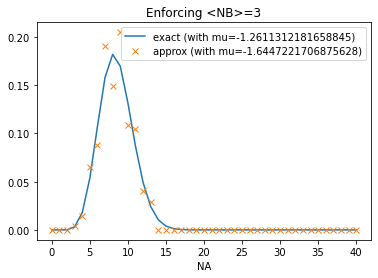

real mu, obtained with OmegaB -1.4451348611428236
mu estimated, obtained with OB -1.8290545527345967


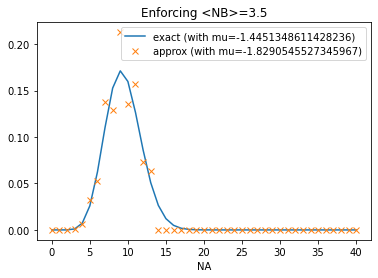

real mu, obtained with OmegaB -1.6094379124341
mu estimated, obtained with OB -1.993444260126185


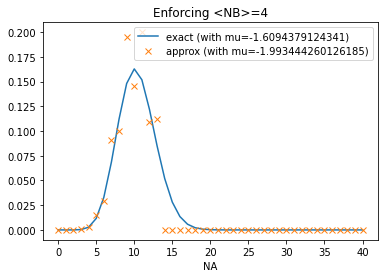

real mu, obtained with OmegaB -1.7589696464050641
mu estimated, obtained with OB -2.1430087567872684


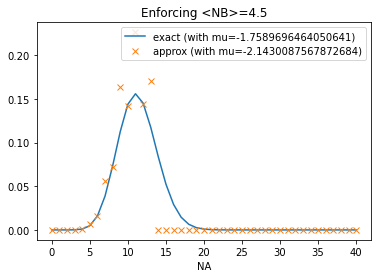

real mu, obtained with OmegaB -1.8971199848858806
mu estimated, obtained with OB -2.2812056406738628


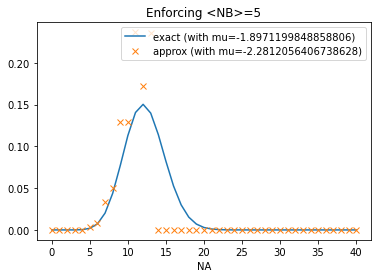

real mu, obtained with OmegaB -2.026331716365887
mu estimated, obtained with OB -2.4105317302349403


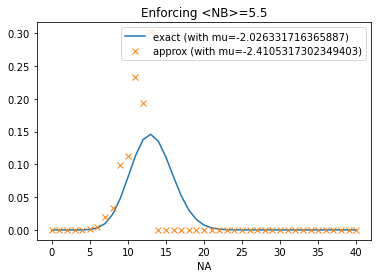

real mu, obtained with OmegaB -2.148434413166787
mu estimated, obtained with OB -2.5329038393014325


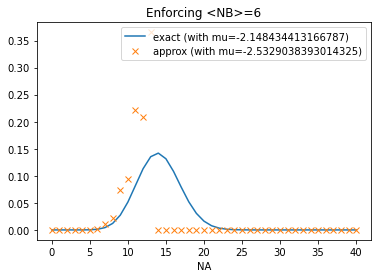

real mu, obtained with OmegaB -2.2648447650111985
mu estimated, obtained with OB -2.649893563368967


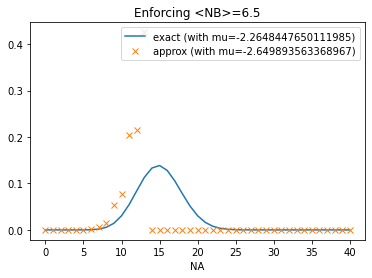

real mu, obtained with OmegaB -2.3766930651477676
mu estimated, obtained with OB -2.7628909892306757


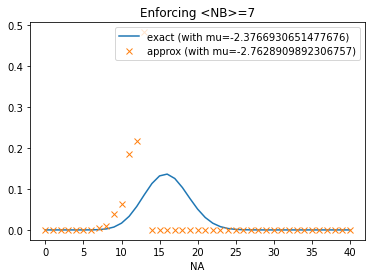

real mu, obtained with OmegaB -2.4849066497880004
mu estimated, obtained with OB -2.8732331762868872


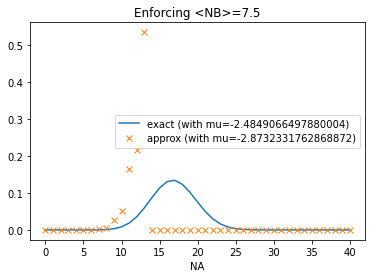

real mu, obtained with OmegaB -2.5902671654458267
mu estimated, obtained with OB -2.9823189156393277


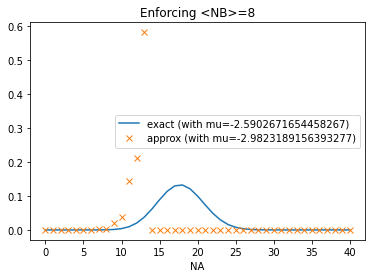

real mu, obtained with OmegaB -2.693451401681057
mu estimated, obtained with OB -3.091729581602319


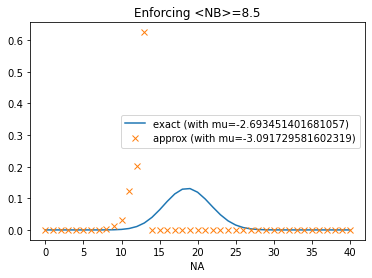

real mu, obtained with OmegaB -2.7950615780918397
mu estimated, obtained with OB -3.203383507751272


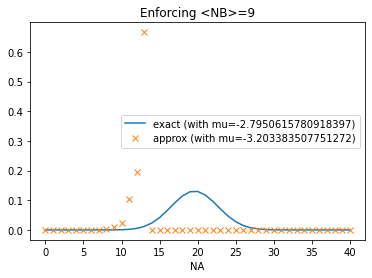

real mu, obtained with OmegaB -2.895648814997008
mu estimated, obtained with OB -3.319771276044502


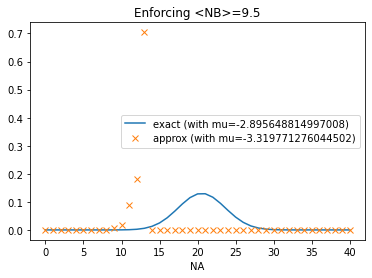

real mu, obtained with OmegaB -2.995732273553991
mu estimated, obtained with OB -3.4443658864616453


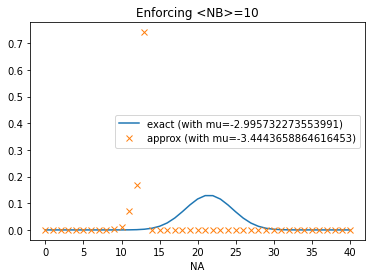

real mu, obtained with OmegaB -3.0958157321109736
mu estimated, obtained with OB -3.5824200958909223


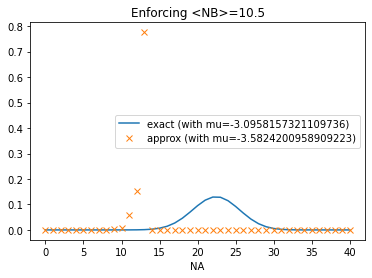

real mu, obtained with OmegaB -3.196402969016142
mu estimated, obtained with OB -3.742705049210547


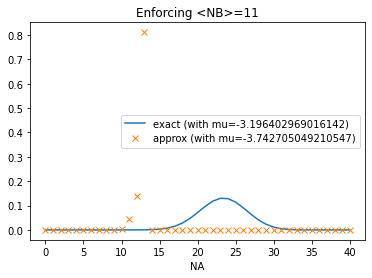

real mu, obtained with OmegaB -3.298013145426924
mu estimated, obtained with OB -3.941922770753867


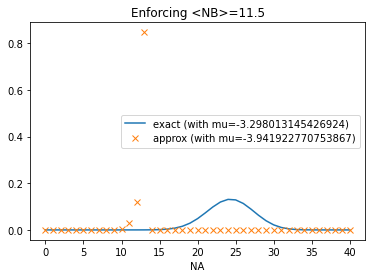

real mu, obtained with OmegaB -3.401197381662155
mu estimated, obtained with OB -4.2188430265487975


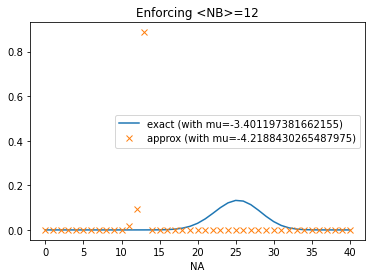

real mu, obtained with OmegaB -3.506557897319982
mu estimated, obtained with OB -4.704346020846108


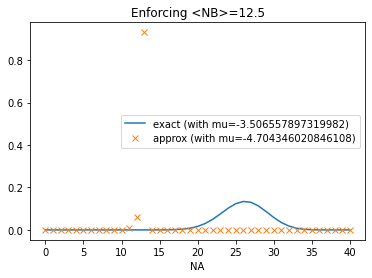

real mu, obtained with OmegaB -3.6147714819602146
mu estimated, obtained with OB -8.17724786559528


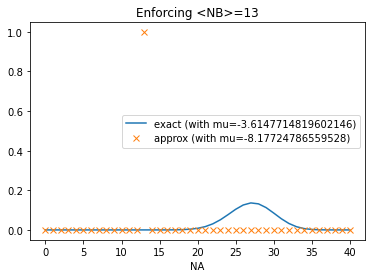

real mu, obtained with OmegaB -3.7266197820967832
mu estimated, obtained with OB nan


/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


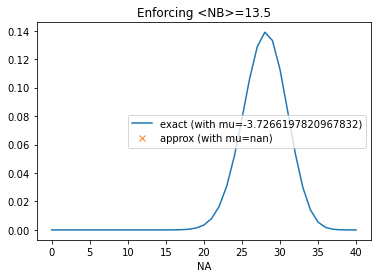

real mu, obtained with OmegaB -3.8430301339411934
mu estimated, obtained with OB nan


/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


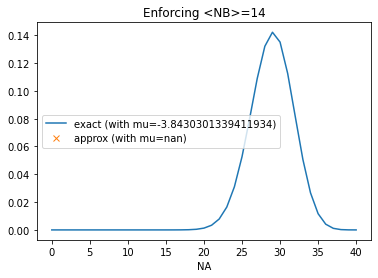

real mu, obtained with OmegaB -3.9651328307420943
mu estimated, obtained with OB nan


/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


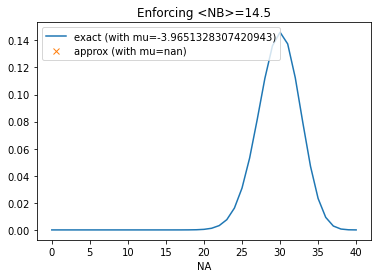

real mu, obtained with OmegaB -4.0943445622221
mu estimated, obtained with OB nan


/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


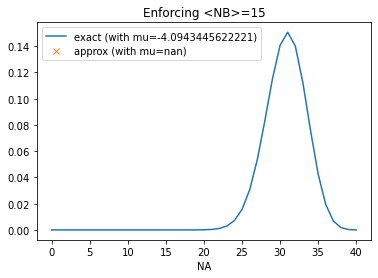

real mu, obtained with OmegaB -4.232494900702916
mu estimated, obtained with OB nan


/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


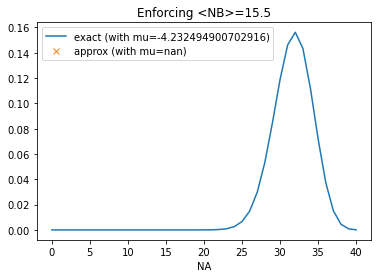

real mu, obtained with OmegaB -4.38202663467388
mu estimated, obtained with OB nan


/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


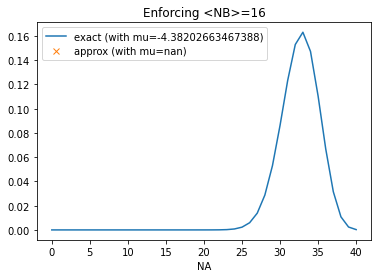

real mu, obtained with OmegaB -4.546329685965156
mu estimated, obtained with OB nan


/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


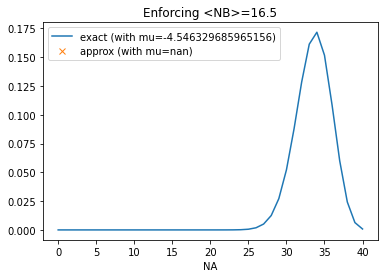

real mu, obtained with OmegaB -4.730333328942096
mu estimated, obtained with OB

/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


 nan


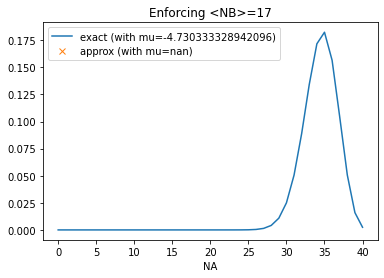

/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


real mu, obtained with OmegaB -4.941642422609301
mu estimated, obtained with OB nan


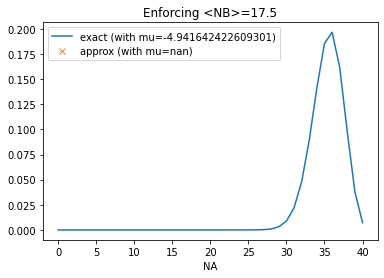

real mu, obtained with OmegaB -5.192956850890209
mu estimated, obtained with OB nan


/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


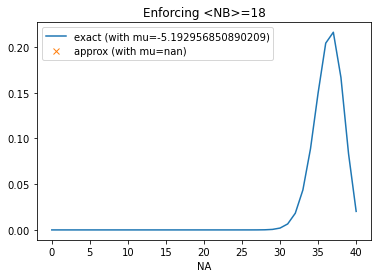

real mu, obtained with OmegaB -5.508037897530102
mu estimated, obtained with OB nan


/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


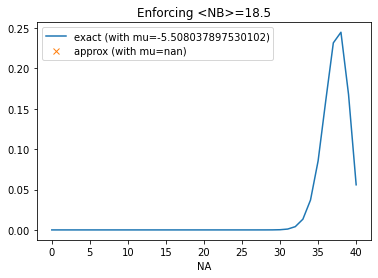

real mu, obtained with OmegaB -5.9401712527204245
mu estimated, obtained with OB nan


/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


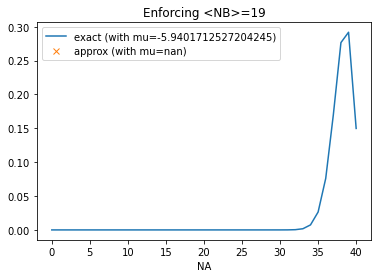

real mu, obtained with OmegaB -6.659293919683628
mu estimated, obtained with OB nan


/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


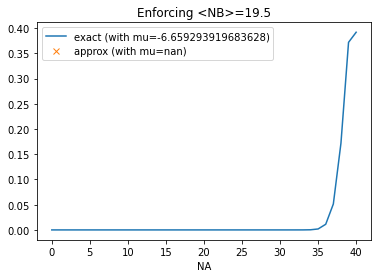

real mu, obtained with OmegaB -8.288991048137342
mu estimated, obtained with OB nan


/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/opt/local/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


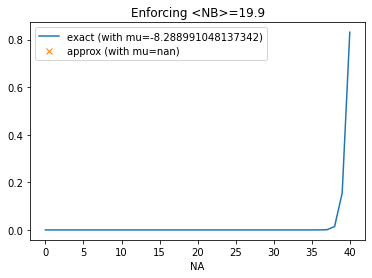

In [31]:
plot_PA_of_NB(OmegaA, OmegaB, OA, OB)

### Finite sampling effects

I redo the same with finite sampling

compare exact=True (previous plots) with exact=False

# iterations 99999


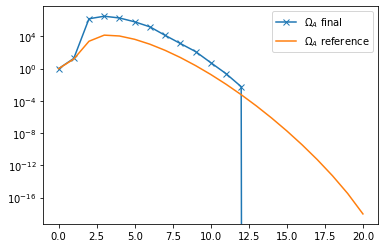

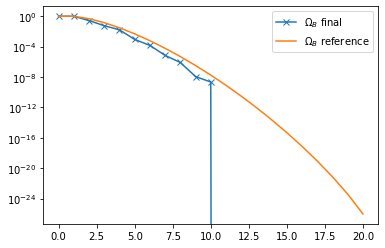

In [64]:
A, B = generate_histograms(OmegaA, OmegaB, L, exact=False)
OA, OB = solve(A, B, L)

plt.plot(OA, "x-", label="$\Omega_A$ final")
plt.plot(OmegaA, "-", label="$\Omega_A$ reference")

plt.yscale("log")
plt.legend()
plt.show()
plt.plot(OB, "x-", label="$\Omega_B$ final")
plt.plot(OmegaB, "-", label="$\Omega_B$ reference")
plt.yscale("log")
plt.legend()
plt.show()

real mu, obtained with OmegaB 2.297531701618791
mu estimated, obtained with OB 2.321308541319684


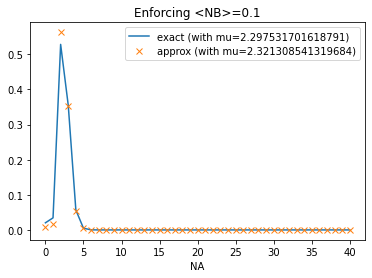

real mu, obtained with OmegaB 0.6678293725756533
mu estimated, obtained with OB 0.752294172826299


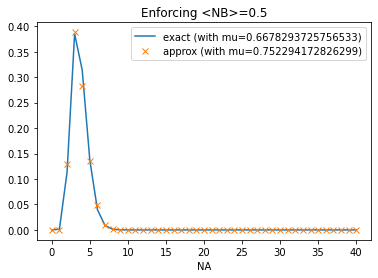

real mu, obtained with OmegaB -0.05129329438754926
mu estimated, obtained with OB 0.07401147342497334


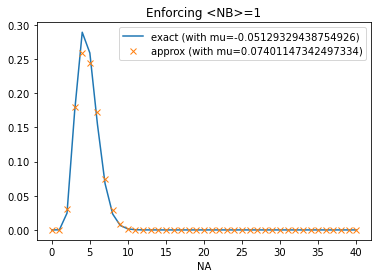

real mu, obtained with OmegaB -0.4834266495778757
mu estimated, obtained with OB -0.33228668952535173


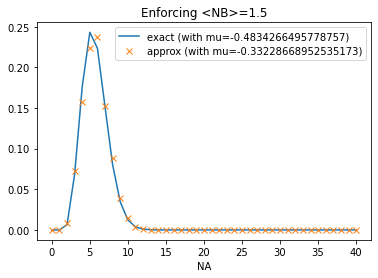

real mu, obtained with OmegaB -0.798507696217771
mu estimated, obtained with OB -0.6287244007374587


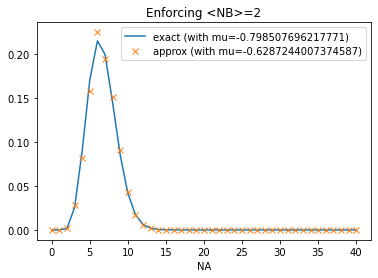

real mu, obtained with OmegaB -1.0498221244986776
mu estimated, obtained with OB -0.8661864531086697


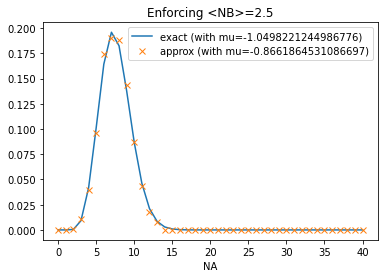

real mu, obtained with OmegaB -1.2611312181658845
mu estimated, obtained with OB -1.0671939496894638


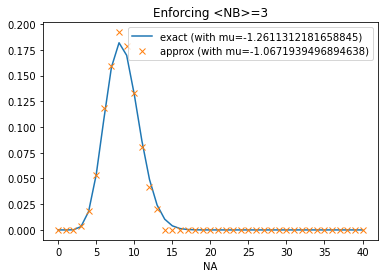

real mu, obtained with OmegaB -1.4451348611428236
mu estimated, obtained with OB -1.24306748422819


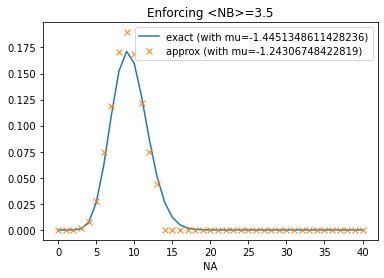

real mu, obtained with OmegaB -1.6094379124341
mu estimated, obtained with OB -1.399915038868622


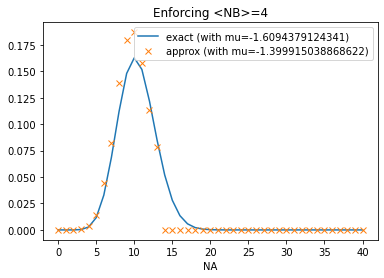

real mu, obtained with OmegaB -1.7589696464050641
mu estimated, obtained with OB -1.5416831830813702


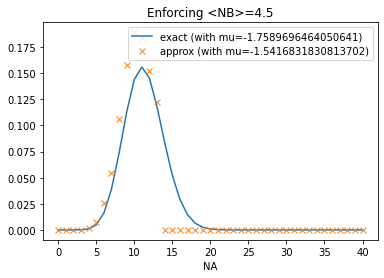

real mu, obtained with OmegaB -1.8971199848858806
mu estimated, obtained with OB -1.6718573222340167


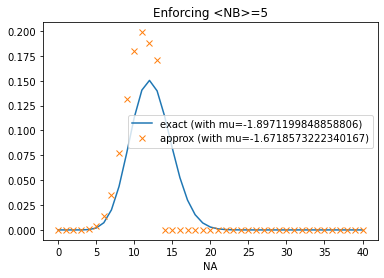

real mu, obtained with OmegaB -2.026331716365887
mu estimated, obtained with OB -1.7941674910811944


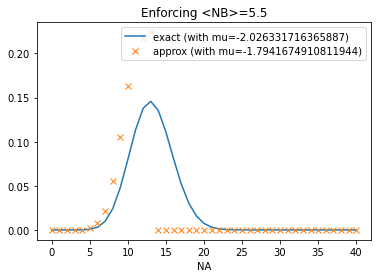

real mu, obtained with OmegaB -2.148434413166787
mu estimated, obtained with OB -1.912799696815722


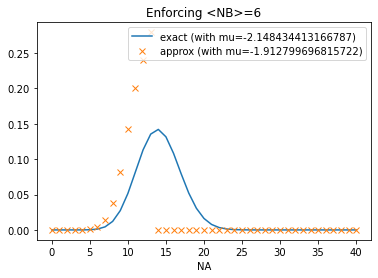

real mu, obtained with OmegaB -2.2648447650111985
mu estimated, obtained with OB -2.032700935815168


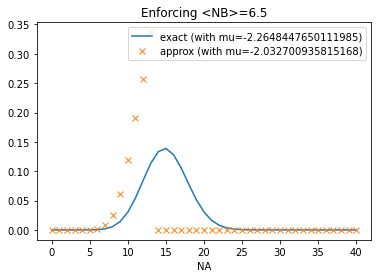

real mu, obtained with OmegaB -2.3766930651477676
mu estimated, obtained with OB -2.160498770442708


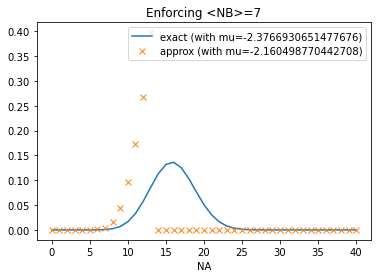

real mu, obtained with OmegaB -2.4849066497880004
mu estimated, obtained with OB -2.3070290737954746


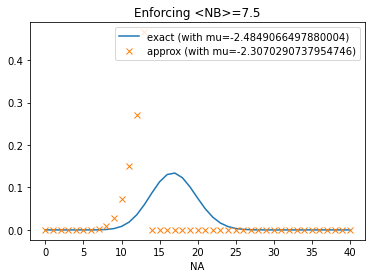

real mu, obtained with OmegaB -2.5902671654458267
mu estimated, obtained with OB -2.4954717965487756


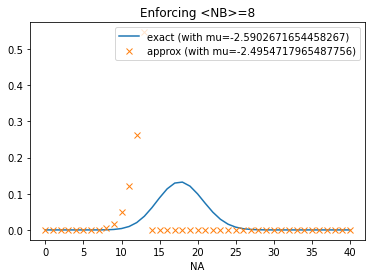

real mu, obtained with OmegaB -2.693451401681057
mu estimated, obtained with OB -2.801933450736149


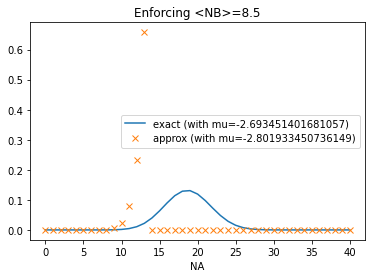

real mu, obtained with OmegaB -2.7950615780918397
mu estimated, obtained with OB -5.339384118346787


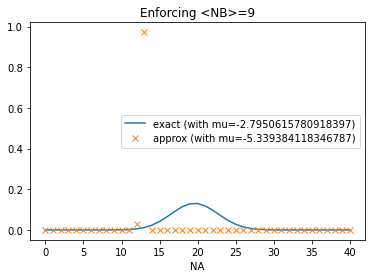

real mu, obtained with OmegaB -2.895648814997008
mu estimated, obtained with OB nan


/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


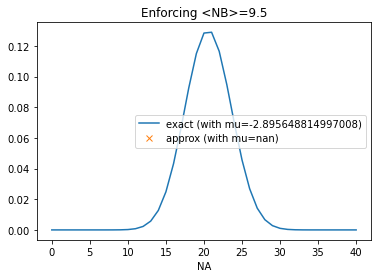

real mu, obtained with OmegaB -2.995732273553991


/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


mu estimated, obtained with OB nan


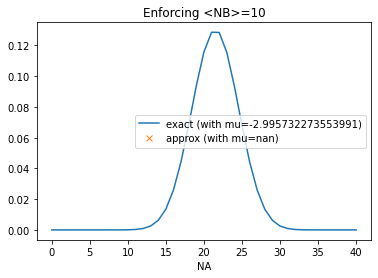

real mu, obtained with OmegaB -3.0958157321109736


/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


mu estimated, obtained with OB nan


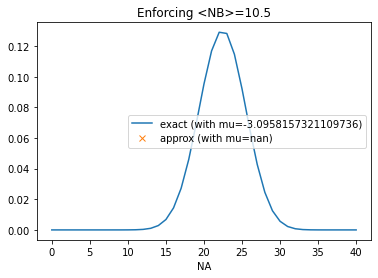

real mu, obtained with OmegaB -3.196402969016142


/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


mu estimated, obtained with OB nan


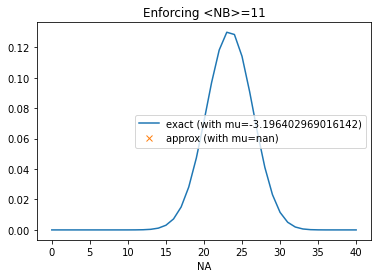

real mu, obtained with OmegaB -3.298013145426924
mu estimated, obtained with OB nan


/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


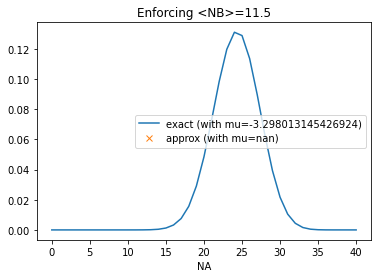

real mu, obtained with OmegaB -3.401197381662155


/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


mu estimated, obtained with OB nan


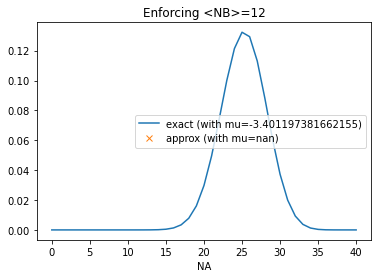

real mu, obtained with OmegaB -3.506557897319982
mu estimated, obtained with OB nan


/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


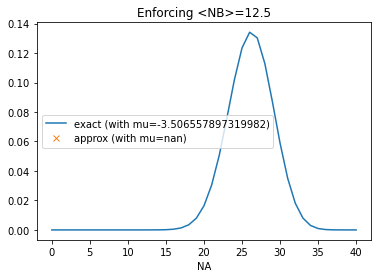

real mu, obtained with OmegaB -3.6147714819602146
mu estimated, obtained with OB nan


/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


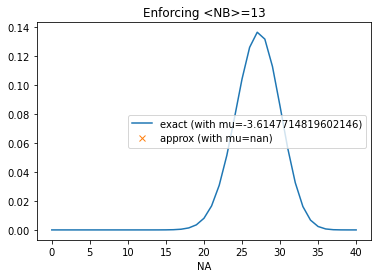

real mu, obtained with OmegaB -3.7266197820967832
mu estimated, obtained with OB nan


/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


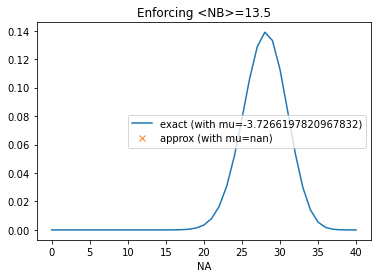

real mu, obtained with OmegaB -3.8430301339411934
mu estimated, obtained with OB nan


/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


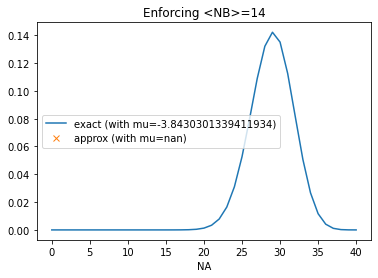

real mu, obtained with OmegaB -3.9651328307420943
mu estimated, obtained with OB

/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


 nan


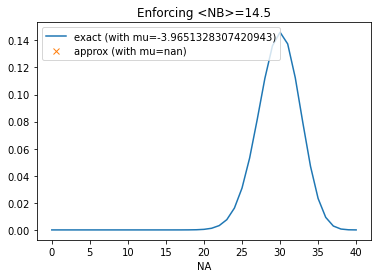

real mu, obtained with OmegaB

/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


 -4.0943445622221
mu estimated, obtained with OB nan


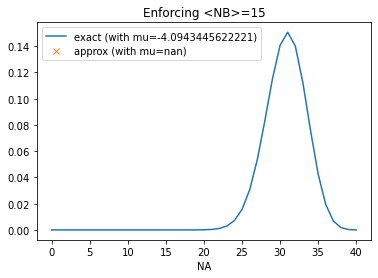

real mu, obtained with OmegaB

/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


 -4.232494900702916
mu estimated, obtained with OB nan


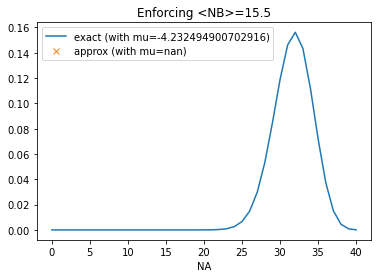

real mu, obtained with OmegaB

/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


 -4.38202663467388
mu estimated, obtained with OB nan


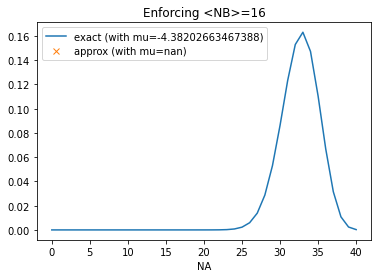

real mu, obtained with OmegaB

/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


 -4.546329685965156
mu estimated, obtained with OB nan


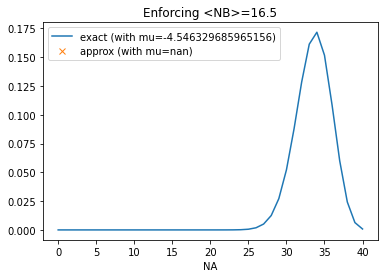

real mu, obtained with OmegaB -4.730333328942096
mu estimated, obtained with OB nan


/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


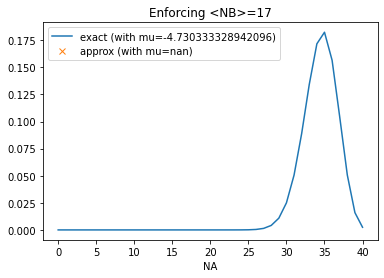

real mu, obtained with OmegaB -4.941642422609301
mu estimated, obtained with OB nan


/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


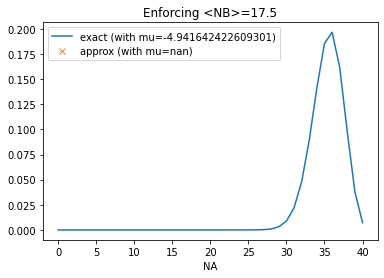

real mu, obtained with OmegaB -5.192956850890209
mu estimated, obtained with OB nan


/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


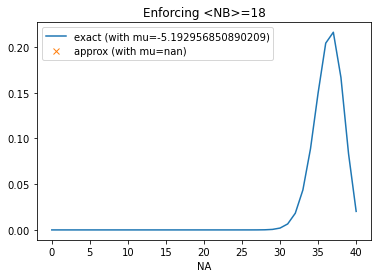

real mu, obtained with OmegaB -5.508037897530102
mu estimated, obtained with OB nan


/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


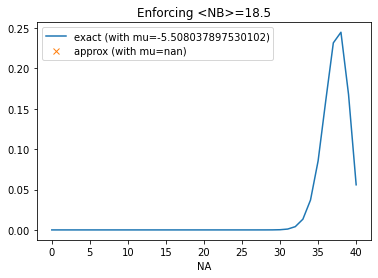

real mu, obtained with OmegaB -5.9401712527204245
mu estimated, obtained with OB

/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


 nan


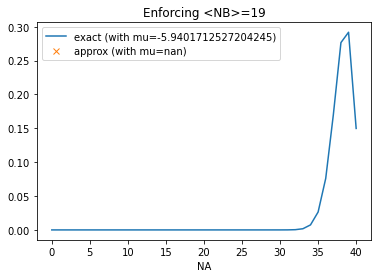

real mu, obtained with OmegaB -6.659293919683628


/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


mu estimated, obtained with OB nan


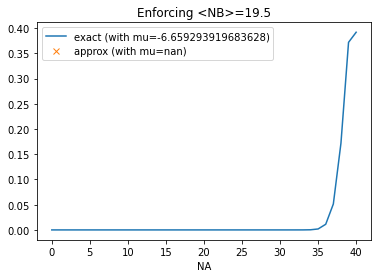

real mu, obtained with OmegaB -8.288991048137342
mu estimated, obtained with OB nan


/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/Users/bussi/.conda/envs/work/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in double_scalars


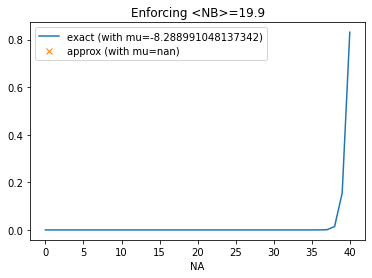

In [24]:
plot_PA_of_NB(OmegaA,OmegaB,OA,OB)

Results are reasonable. Notice that there might be problems if L is too small